# Patterns in encrypted web traffic HTTPs

In [2]:
# import needed python libraries

%matplotlib inline

import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.tree import DecisionTreeRegressor

In [3]:
features_dict = {} #feature dictionary --> feature : description
with open("readme.txt", 'r') as f:
    for i, line in enumerate(f.readlines()):
        if (i >= 2):
            kv = line.split(':')
            features_dict[kv[0].strip()] = kv[1].strip()
            
features_list = list(features_dict.keys())



### Reading of the original dataset

In [4]:
df_flow = pd.read_csv("https_training.csv")
df_flow

,_c_ack_cnt,_c_ack_cnt_p,_c_appdataB,_c_appdataT,_c_bytes_all,_c_bytes_retx,_c_bytes_uniq,_c_cwin_ini,_c_cwin_max,_c_cwin_min,...,_s_ttl_max,_s_ttl_min,_s_win_0,_s_win_max,_s_win_min,_s_win_scl,_tls_session_stat,c_ip,time,label
0,8.0,4.0,569.0,522.003,1672.0,0.0,1672.0,517.0,590.0,51.0,...,59.0,59.0,0.0,31232.0,27680.0,9.0,1.0,67.32.225.92,1.561932e+09,krxd.net
1,10.0,7.0,275.0,39.504,636.0,0.0,636.0,181.0,362.0,1.0,...,59.0,59.0,0.0,29480.0,27680.0,0.0,0.0,67.32.181.213,1.561932e+09,_other
2,7.0,3.0,569.0,110.003,3325.0,0.0,3325.0,517.0,1435.0,51.0,...,59.0,59.0,0.0,34304.0,27680.0,9.0,1.0,67.32.225.92,1.561932e+09,contextweb.com
3,8.0,3.0,453.0,8.813,958.0,0.0,958.0,401.0,557.0,1.0,...,59.0,59.0,0.0,30208.0,27920.0,9.0,0.0,67.32.124.163,1.561932e+09,twitchcdn.net
4,6.0,2.0,0.0,0.000,452.0,0.0,452.0,401.0,401.0,1.0,...,59.0,59.0,0.0,29184.0,27920.0,9.0,0.0,67.32.124.163,1.561932e+09,twitchcdn.net
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147858,8.0,3.0,453.0,10.011,907.0,0.0,907.0,401.0,506.0,51.0,...,59.0,59.0,0.0,30208.0,27920.0,9.0,0.0,67.32.124.163,1.562018e+09,twitchcdn.net
147859,12.0,4.0,446.0,16.000,2068.0,0.0,2068.0,394.0,838.0,51.0,...,59.0,59.0,0.0,33792.0,27920.0,9.0,0.0,67.32.124.163,1.562018e+09,twitch.tv
147860,12.0,6.0,306.0,53.987,430.0,0.0,430.0,212.0,212.0,38.0,...,59.0,59.0,0.0,29184.0,27920.0,9.0,0.0,67.32.230.26,1.562019e+09,everesttech.net
147861,13.0,6.0,306.0,54.000,886.0,0.0,886.0,212.0,543.0,38.0,...,59.0,59.0,0.0,30208.0,27920.0,9.0,0.0,67.32.230.26,1.562019e+09,everesttech.net


At this point we have to merge the original dataset's features at three different levels:i
- Flow (df_flow just read)
- Client IP
- Domain Name (labels)

#### Merging at Client IP and Domain Name levels

In order to merge properly the dataset at the two given levels, a subset of specific features has been selected from the entire set. Here the features selected:
- _c_ack_cnt
- _s_ack_cnt
- _c_appdataB
- _s_appdataB
- _c_bytes_all
- _s_bytes_all
- _c_bytes_retx
- _s_bytes_retx
- _c_cwin_max
- _s_cwin_max
- _c_cwin_min
- _s_cwin_min
- _c_fin_cnt
- _s_fin_cnt
- _s_rtt_avg
- _c_rtt_avg
- _c_rtt_cnt
- _s_rtt_cnt
- _c_rtt_max
- _s_rtt_max
- _c_rtt_min
- _s_rtt_min
- _c_rtt_std
- _s_rtt_std
- _c_syn_cnt
- _s_syn_cnt
- _durat_all
- _durat_mean
 
##SCRIVERE CASI PARTICOLARI FEATURES PER I DUE LEVEL


#### Domain Name Level

In [5]:
label=[]
_c_ack_cnt=[]
_s_ack_cnt=[]
_c_appdataB=[]
_s_appdataB=[]
_c_bytes_all=[]
_s_bytes_all=[]
_c_bytes_retx=[]
_s_bytes_retx=[]
_c_cwin_max=[]
_s_cwin_max=[]
_c_cwin_min=[]
_s_cwin_min=[]
_c_fin_cnt=[]
_s_fin_cnt=[]
_s_rtt_avg=[]
_c_rtt_avg=[]
_c_rtt_cnt=[]
_s_rtt_cnt=[]
_c_rtt_max=[]
_s_rtt_max=[]
_c_rtt_min=[]
_s_rtt_min=[]
_c_rtt_std=[]
_s_rtt_std=[]
_c_syn_cnt=[]
_s_syn_cnt=[]
_durat_all=[]
_durat_mean=[]
distinct_ip=[]

groups = df_flow.groupby('label')

for lab, group in groups:
    label.append(lab)
    _c_ack_cnt.append(group["_c_ack_cnt"].sum())
    _s_ack_cnt.append(group["_s_ack_cnt"].sum())
    _c_appdataB.append(group["_c_appdataB"].sum())
    _c_bytes_all.append(group["_c_bytes_all"].sum())
    _s_appdataB.append(group["_s_appdataB"].sum())
    _s_bytes_all.append(group["_s_bytes_all"].sum())
    _c_bytes_retx.append(group["_c_bytes_retx"].sum())
    _s_bytes_retx.append(group["_s_bytes_retx"].sum())
    _c_cwin_max.append(group["_c_cwin_max"].max())
    _s_cwin_max.append(group["_s_cwin_max"].max())
    _c_cwin_min.append(group["_c_cwin_max"].min())
    _s_cwin_min.append(group["_s_cwin_max"].min())
    _c_fin_cnt.append(group["_c_fin_cnt"].sum())
    _s_fin_cnt.append(group["_s_fin_cnt"].sum())
    _c_rtt_avg.append(group["_c_rtt_avg"].mean())
    _s_rtt_avg.append(group["_s_rtt_avg"].mean())
    _c_rtt_cnt.append(group["_c_rtt_cnt"].sum())
    _s_rtt_cnt.append(group["_s_rtt_cnt"].sum())
    _c_rtt_max.append(group["_c_rtt_max"].max())
    _c_rtt_min.append(group["_c_rtt_min"].min())
    _s_rtt_max.append(group["_s_rtt_max"].max())
    _s_rtt_min.append(group["_s_rtt_min"].min())
    _c_rtt_std.append(group["_c_rtt_std"].std())
    _s_rtt_std.append(group["_s_rtt_std"].std())
    _c_syn_cnt.append(group["_c_syn_cnt"].sum())
    _s_syn_cnt.append(group["_s_syn_cnt"].sum())
    _durat_all.append(group["_durat"].sum())
    _durat_mean.append(group["_durat"].mean())
    distinct_ip.append(group["c_ip"].nunique())

df_DomainName = pd.DataFrame({
    "label": label,
    "_c_ack_cnt": _c_ack_cnt,
    "_s_ack_cnt": _s_ack_cnt,
    "_c_appdataB": _c_appdataB,
    "_s_appdataB": _s_appdataB,
    "_c_bytes_all": _c_bytes_all,
    "_s_bytes_all": _s_bytes_all,
    "_c_bytes_retx": _c_bytes_retx,
    "_s_bytes_retx": _s_bytes_retx,
    "_c_cwin_max": _c_cwin_max,
    "_s_cwin_max": _s_cwin_max,
    "_c_cwin_min": _c_cwin_min,
    "_s_cwin_min": _s_cwin_min,
    "_c_fin_cnt": _c_fin_cnt,
    "_s_fin_cnt": _s_fin_cnt,
    "_s_rtt_avg": _s_rtt_avg,
    "_c_rtt_avg": _c_rtt_avg,
    "_s_rtt_max": _s_rtt_max,
    "_c_rtt_max": _c_rtt_max,
    "_s_rtt_min": _s_rtt_min,
    "_c_rtt_min": _c_rtt_min,
    "_s_rtt_cnt": _s_rtt_cnt,
    "_c_rtt_cnt": _c_rtt_cnt,
    "_s_rtt_std": _s_rtt_std,
    "_c_rtt_std": _c_rtt_std,
    "_c_syn_cnt": _c_syn_cnt,
    "_s_syn_cnt": _s_syn_cnt,
    "_durat_all": _durat_all,
    "_durat_mean": _durat_mean,
    "distinct_ip": distinct_ip
})

df_DomainName.set_index("label", inplace=True)
df_DomainName

,_c_ack_cnt,_s_ack_cnt,_c_appdataB,_s_appdataB,_c_bytes_all,_s_bytes_all,_c_bytes_retx,_s_bytes_retx,_c_cwin_max,_s_cwin_max,...,_c_rtt_min,_s_rtt_cnt,_c_rtt_cnt,_s_rtt_std,_c_rtt_std,_c_syn_cnt,_s_syn_cnt,_durat_all,_durat_mean,distinct_ip
label,,,,,,,,,,,,,,,,,,,,,
_other,4745970.0,11912416.0,15751180.0,133442340.0,331361445.0,1.540512e+10,1905144.0,58085796.0,704512.0,1849024.0,...,0.013,2751020.0,499238.0,5423.950706,8.545710,35309.0,35350.0,5.100494e+09,145383.631219,615
adnxs.com,79728.0,121607.0,1169086.0,9611371.0,17236497.0,1.201112e+08,107265.0,453622.0,9312.0,206608.0,...,0.081,43272.0,21109.0,5404.045723,10.113450,3847.0,3880.0,3.340187e+08,87006.696000,233
ads-twitter.com,21492.0,20572.0,558751.0,3276698.0,1467341.0,5.923773e+06,15942.0,66719.0,1766.0,4361.0,...,0.122,8252.0,8961.0,8917.520389,8.071486,1328.0,1331.0,2.678741e+08,202169.117375,154
chartbeat.com,24945.0,24107.0,758851.0,5203103.0,1717590.0,6.764917e+06,15942.0,67253.0,929.0,6083.0,...,0.100,9041.0,9757.0,12689.497357,6.401096,1413.0,1417.0,3.374308e+08,238804.558303,145
contextweb.com,38850.0,36811.0,1407849.0,8008777.0,5978787.0,1.371264e+07,61048.0,203569.0,4450.0,11996.0,...,0.104,14944.0,14761.0,6113.567496,7.365877,2829.0,2847.0,4.157219e+08,147210.311608,291
disqus.com,55156.0,63795.0,1601947.0,8752961.0,7369940.0,3.548911e+07,209036.0,429020.0,4011.0,29427.0,...,0.093,23707.0,17402.0,4428.514658,9.859792,3219.0,3241.0,4.879746e+08,153789.659186,125
everesttech.net,62764.0,64982.0,1695380.0,20785744.0,5115452.0,2.493379e+07,66929.0,344340.0,3969.0,45051.0,...,0.103,25459.0,24269.0,7623.067028,7.525888,3416.0,3446.0,6.351484e+08,186369.834579,348
fastly-insights.com,17276.0,17570.0,678385.0,5224087.0,3480533.0,8.297167e+06,12022.0,41021.0,2680.0,10021.0,...,0.098,8138.0,6809.0,2591.393177,3.838366,1315.0,1313.0,4.235074e+07,32353.502924,28
fastly.net,75857.0,121127.0,880608.0,5354981.0,4147720.0,1.367720e+08,44045.0,548499.0,2301.0,262144.0,...,0.175,50651.0,12004.0,6507.395945,11.197999,1882.0,1889.0,2.511803e+08,134392.860900,115


#### Client IP level

In [6]:
c_ip=[]
_c_ack_cnt=[]
_s_ack_cnt=[]
_c_appdataB=[]
_s_appdataB=[]
_c_bytes_all=[]
_s_bytes_all=[]
_c_bytes_retx=[]
_s_bytes_retx=[]
_c_cwin_max=[]
_s_cwin_max=[]
_c_cwin_min=[]
_s_cwin_min=[]
_c_fin_cnt=[]
_s_fin_cnt=[]
_s_rtt_avg=[]
_c_rtt_avg=[]
_c_rtt_cnt=[]
_s_rtt_cnt=[]
_c_rtt_max=[]
_s_rtt_max=[]
_c_rtt_min=[]
_s_rtt_min=[]
_c_rtt_std=[]
_s_rtt_std=[]
_c_syn_cnt=[]
_s_syn_cnt=[]
_durat_all=[]
_durat_mean=[]
_s_distinct=[]

groups = df_flow.groupby('c_ip')
for ip, group in groups:
    c_ip.append(ip)
    _c_ack_cnt.append(group["_c_ack_cnt"].sum())
    _s_ack_cnt.append(group["_s_ack_cnt"].sum())
    _c_appdataB.append(group["_c_appdataB"].sum())
    _c_bytes_all.append(group["_c_bytes_all"].sum())
    _s_appdataB.append(group["_s_appdataB"].sum())
    _s_bytes_all.append(group["_s_bytes_all"].sum())
    _c_bytes_retx.append(group["_c_bytes_retx"].sum())
    _s_bytes_retx.append(group["_s_bytes_retx"].sum())
    _c_cwin_max.append(group["_c_cwin_max"].max())
    _s_cwin_max.append(group["_s_cwin_max"].max())
    _c_cwin_min.append(group["_c_cwin_max"].min())
    _s_cwin_min.append(group["_s_cwin_max"].min())
    _c_fin_cnt.append(group["_c_fin_cnt"].sum())
    _s_fin_cnt.append(group["_s_fin_cnt"].sum())
    _c_rtt_avg.append(group["_c_rtt_avg"].mean())
    _s_rtt_avg.append(group["_s_rtt_avg"].mean())
    _c_rtt_cnt.append(group["_c_rtt_cnt"].sum())
    _s_rtt_cnt.append(group["_s_rtt_cnt"].sum())
    _c_rtt_max.append(group["_c_rtt_max"].max())
    _c_rtt_min.append(group["_c_rtt_min"].min())
    _s_rtt_max.append(group["_s_rtt_max"].max())
    _s_rtt_min.append(group["_s_rtt_min"].min())
    _c_rtt_std.append(group["_c_rtt_std"].std())
    _s_rtt_std.append(group["_s_rtt_std"].std())
    _c_syn_cnt.append(group["_c_syn_cnt"].sum())
    _s_syn_cnt.append(group["_s_syn_cnt"].sum())
    _durat_all.append(group["_durat"].sum())
    _durat_mean.append(group["_durat"].mean())
    _s_distinct.append(group["label"].nunique())

df_ip = pd.DataFrame({
    "c_ip": c_ip,
    "_c_ack_cnt": _c_ack_cnt,
    "_s_ack_cnt": _s_ack_cnt,
    "_c_appdataB": _c_appdataB,
    "_s_appdataB": _s_appdataB,
    "_c_bytes_all": _c_bytes_all,
    "_s_bytes_all": _s_bytes_all,
    "_c_bytes_retx": _c_bytes_retx,
    "_s_bytes_retx": _s_bytes_retx,
    "_c_cwin_max": _c_cwin_max,
    "_s_cwin_max": _s_cwin_max,
    "_c_cwin_min": _c_cwin_min,
    "_s_cwin_min": _s_cwin_min,
    "_c_fin_cnt": _c_fin_cnt,
    "_s_fin_cnt": _s_fin_cnt,
    "_s_rtt_avg": _s_rtt_avg,
    "_c_rtt_avg": _c_rtt_avg,
    "_s_rtt_max": _s_rtt_max,
    "_c_rtt_max": _c_rtt_max,
    "_s_rtt_min": _s_rtt_min,
    "_c_rtt_min": _c_rtt_min,
    "_s_rtt_cnt": _s_rtt_cnt,
    "_c_rtt_cnt": _c_rtt_cnt,
    "_s_rtt_std": _s_rtt_std,
    "_c_rtt_std": _c_rtt_std,
    "_c_syn_cnt": _c_syn_cnt,
    "_s_syn_cnt": _s_syn_cnt,
    "_durat_all": _durat_all,
    "_durat_mean": _durat_mean,
    "_s_distinct": _s_distinct
})
df_ip.set_index("c_ip", inplace=True)
df_ip

,_c_ack_cnt,_s_ack_cnt,_c_appdataB,_s_appdataB,_c_bytes_all,_s_bytes_all,_c_bytes_retx,_s_bytes_retx,_c_cwin_max,_s_cwin_max,...,_c_rtt_min,_s_rtt_cnt,_c_rtt_cnt,_s_rtt_std,_c_rtt_std,_c_syn_cnt,_s_syn_cnt,_durat_all,_durat_mean,_s_distinct
c_ip,,,,,,,,,,,,,,,,,,,,,
67.32.100.15,878.0,2320.0,17719.0,187375.0,61531.0,2691442.0,0.0,0.0,2962.0,69200.0,...,0.384,595.0,226.0,2686.461578,7.477731,33.0,33.0,2.065845e+06,62601.367364,7
67.32.100.172,73.0,85.0,1791.0,11232.0,7565.0,26266.0,41.0,0.0,1307.0,6783.0,...,1.947,17.0,17.0,14146.282878,3.648186,3.0,3.0,1.892266e+06,630755.490333,2
67.32.100.217,305.0,438.0,9013.0,17415.0,40132.0,295756.0,62.0,0.0,1308.0,13952.0,...,1.545,144.0,117.0,38.786557,8.854713,19.0,19.0,8.969703e+05,47208.965474,2
67.32.100.226,997.0,2317.0,10315.0,60858.0,36286.0,2597759.0,271.0,0.0,817.0,71196.0,...,1.200,530.0,163.0,37.055295,7.604813,30.0,30.0,1.257009e+07,419003.129067,2
67.32.100.228,3289.0,33592.0,10411.0,67763.0,60452.0,45793262.0,0.0,0.0,2036.0,692831.0,...,0.273,1922.0,196.0,7.320021,6.757891,18.0,18.0,2.447943e+06,135996.809944,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67.32.99.1,683.0,833.0,10994.0,108713.0,44079.0,379754.0,238.0,0.0,2120.0,27920.0,...,0.568,256.0,188.0,7.424056,9.122998,21.0,21.0,1.141335e+07,543492.776095,9
67.32.99.11,51.0,56.0,611.0,4492.0,3160.0,24736.0,13.0,0.0,669.0,6586.0,...,1.966,22.0,16.0,0.367775,7.252648,4.0,4.0,6.001500e+05,150037.499000,1
67.32.99.149,3348.0,8876.0,41795.0,376073.0,178602.0,9951653.0,913.0,15924.0,8154.0,224756.0,...,0.381,1842.0,670.0,2593.801621,7.803855,89.0,89.0,3.635271e+07,408457.373360,17


# Section 1 - Data Exploration and Pre-Processing

In this section, we will analyze the behaviour of selected features at different levels (flow, IP, domain name). 
We have chosen a subset of these features, including:

## Client:
- `_c_appdataB`: Number of bytes of application data sent by the client.
- `_c_bytes_all`: Number of bytes transmitted by the client.
- `_c_rtt_avg`: The average RTT from client to server.

## Server:
- `_s_appdataB`: Number of bytes of application data sent by the server.
- `_s_bytes_all`: Number of bytes transmitted by the server.
- `_s_rtt_avg`: The average RTT from server to client.

## General:
- `durat`: Duration of the connections.



























#### Plotting the cumulative distribution function (ECDF)

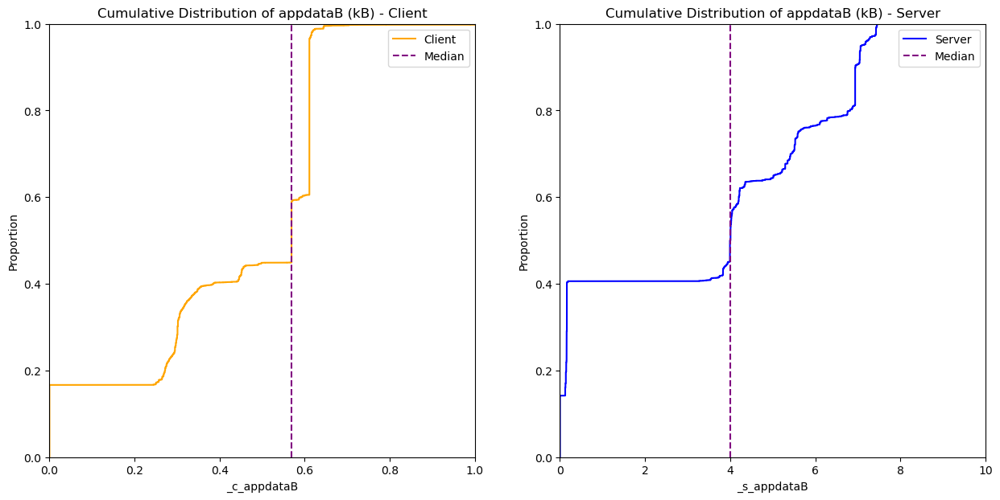

Client - Median: 0.57 kB
Server - Median: 4.00 kB


In [25]:
# Client/Server Features  ---> ### to add prefixes _c_ or _s_ ###
_c_s_features = [
   'appdataB', 'bytes_all', 'rtt_avg'
]

fig, axs = plt.subplots(1, 2, figsize=(15, 7))

f = "appdataB"

df_copy = df_flow.copy()
df_copy["_c_"+f] = df_flow["_c_"+f]/1000 #convert to kB
df_copy["_s_"+f] = df_flow["_s_"+f]/1000 #convert to kB

# Calculate medians for the client and server features
median_c = df_copy["_c_" + f].median()
median_s = df_copy["_s_" + f].median()



# Plot ECDF for the client feature
sns.ecdfplot(
    data=df_copy,
    x="_c_" + f,
    color="Orange",
    label="Client",
    ax=axs[0]
)

# Mark median on the plot
axs[0].axvline(x=median_c, color="purple", linestyle="--", label="Median")

# Plot ECDF for the server feature
sns.ecdfplot(
    data=df_copy,
    x="_s_" + f,
    color="Blue",
    label="Server",
    ax=axs[1]
)

# Mark median on the plot
axs[1].axvline(x=median_s, color="purple", linestyle="--", label="Median")

# Set plot titles
axs[0].set_title(f'Cumulative Distribution of {f} (kB) - Client')
axs[1].set_title(f'Cumulative Distribution of {f} (kB) - Server')

# Set x-axis limits
axs[0].set_xlim(0, 1)
axs[1].set_xlim(0, 10)


# Display legends
axs[0].legend()
axs[1].legend()

# Show the plot
plt.show()

# Display the values of the medians
print(f"Client - Median: {median_c:.2f} kB")
print(f"Server - Median: {median_s:.2f} kB")






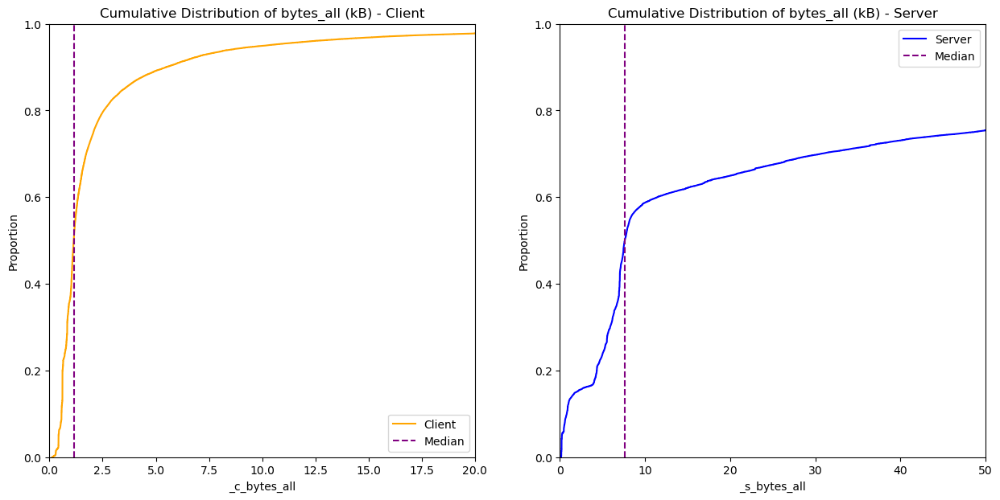

Client - Median: 1.14 kB
Server - Median: 7.62 kB


In [45]:
# Client/Server Features  ---> ### to add prefixes _c_ or _s_ ###
_c_s_features = [
   'appdataB', 'bytes_all', 'rtt_avg'
]



fig, axs = plt.subplots(1, 2, figsize=(15, 7))

f = "bytes_all"

df_copy = df_flow.copy()
df_copy["_c_"+f] = df_flow["_c_"+f]/1000 #convert to kB
df_copy["_s_"+f] = df_flow["_s_"+f]/1000 #convert to kB

# Calculate medians for the client and server features
median_c = df_copy["_c_" + f].median()
median_s = df_copy["_s_" + f].median()

# Plot ECDF for the client feature
sns.ecdfplot(
    data=df_copy,
    x="_c_" + f,
    color="Orange",
    label="Client",
    ax=axs[0]
)

# Mark median on the plot
axs[0].axvline(x=median_c, color="purple", linestyle="--", label="Median")

# Plot ECDF for the server feature
sns.ecdfplot(
    data=df_copy,
    x="_s_" + f,
    color="Blue",
    label="Server",
    ax=axs[1]
)

# Mark median on the plot
axs[1].axvline(x=median_s, color="purple", linestyle="--", label="Median")

# Set plot titles
axs[0].set_title(f'Cumulative Distribution of {f} (kB) - Client')
axs[1].set_title(f'Cumulative Distribution of {f} (kB) - Server')

# Set x-axis limits
axs[0].set_xlim(0, 20)
axs[1].set_xlim(0, 50)


# Display legends
axs[0].legend()
axs[1].legend()

# Show the plot
plt.show()

# Display the values of the medians
print(f"Client - Median: {median_c:.2f} kB")
print(f"Server - Median: {median_s:.2f} kB")






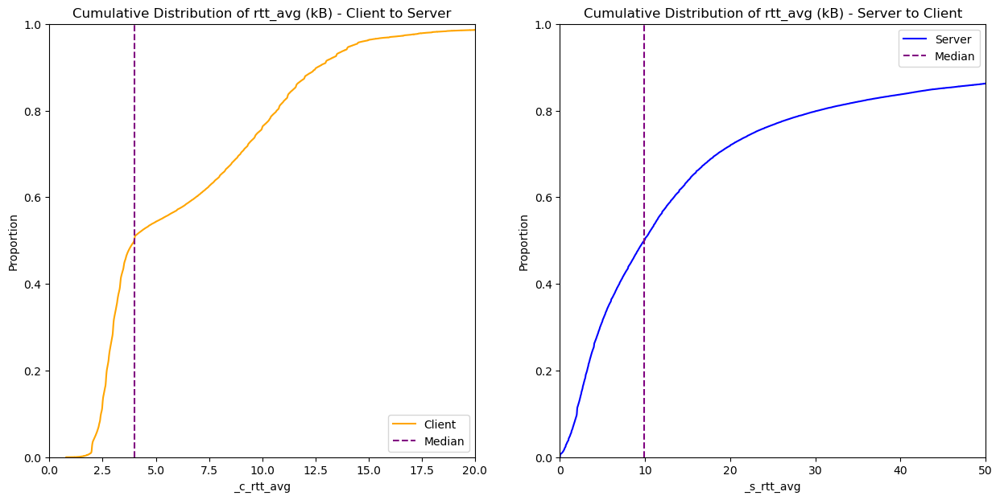

Client - Median: 3.98 ms
Server - Median: 9.90 ms


In [12]:
# Client/Server Features  ---> ### to add prefixes _c_ or _s_ ###
_c_s_features = [
   'appdataB', 'bytes_all', 'rtt_avg'
]



fig, axs = plt.subplots(1, 2, figsize=(15, 7))

f = "rtt_avg"

df_copy = df_flow.copy()

# Calculate medians for the client and server features
median_c = df_copy["_c_" + f].median()
median_s = df_copy["_s_" + f].median()

# Plot ECDF for the client feature
sns.ecdfplot(
    data=df_copy,
    x="_c_" + f,
    color="Orange",
    label="Client",
    ax=axs[0]
)

# Mark median on the plot
axs[0].axvline(x=median_c, color="purple", linestyle="--", label="Median")

# Plot ECDF for the server feature
sns.ecdfplot(
    data=df_copy,
    x="_s_" + f,
    color="Blue",
    label="Server",
    ax=axs[1]
)

# Mark median on the plot
axs[1].axvline(x=median_s, color="purple", linestyle="--", label="Median")

# Set plot titles
axs[0].set_title(f'Cumulative Distribution of {f} (kB) - Client to Server')
axs[1].set_title(f'Cumulative Distribution of {f} (kB) - Server to Client')

# Set x-axis limits
axs[0].set_xlim(0, 20)
axs[1].set_xlim(0, 50)


# Display legends
axs[0].legend()
axs[1].legend()

# Show the plot
plt.show()

# Display the values of the medians
print(f"Client - Median: {median_c:.2f} ms")
print(f"Server - Median: {median_s:.2f} ms")






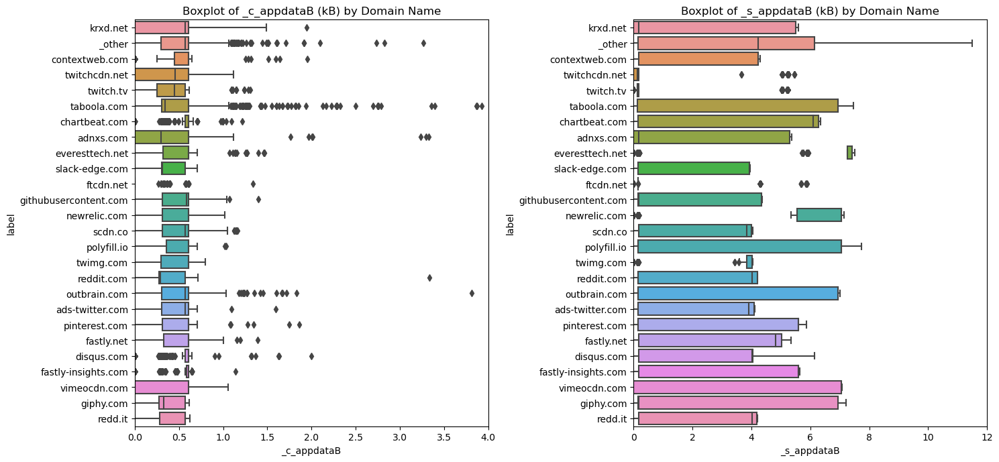

In [11]:
fig, axs = plt.subplots(1, 2, figsize=(15, 7))

df_copy = df_flow.copy()
df_copy['_c_appdataB'] = df_flow['_c_appdataB']/1000 #convert to kB
df_copy['_s_appdataB'] = df_flow['_s_appdataB']/1000 #convert to kB

#Boxplot for _c_appdataB
sns.boxplot(
    data=df_copy,
    x='_c_appdataB',
    y='label',
    ax=axs[0]
)
axs[0].set_title('Boxplot of _c_appdataB (kB) by Domain Name')
axs[0].set_xlim(0, 4)

#Boxplot for _s_appdataB
sns.boxplot(
    data=df_copy,
    x='_s_appdataB',
    y='label',
    ax=axs[1]
)
axs[1].set_title('Boxplot of _s_appdataB (kB) by Domain Name')
axs[1].set_xlim(0, 12)

plt.tight_layout()

plt.show()


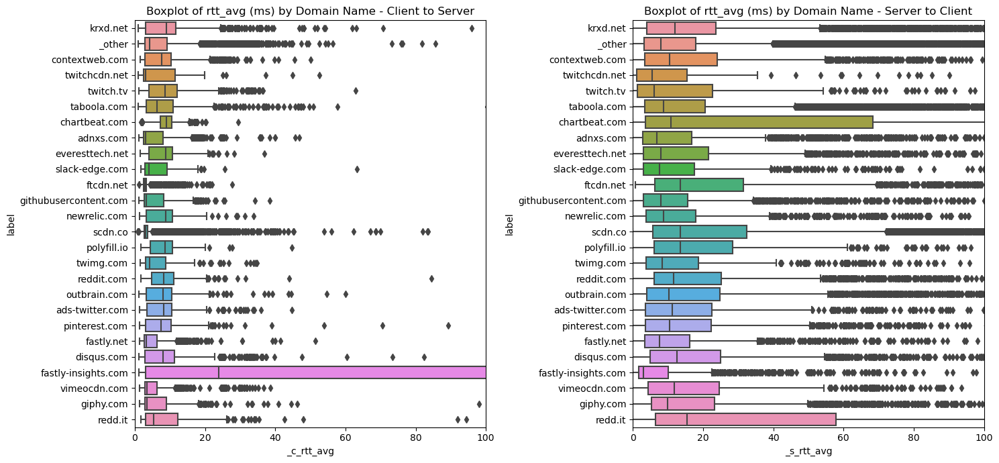

In [16]:
fig, axs = plt.subplots(1, 2, figsize=(15, 7))

df_copy = df_flow.copy()

#Boxplot for _c_appdataB
sns.boxplot(
    data=df_copy,
    x='_c_rtt_avg',
    y='label',
    ax=axs[0]
)

axs[0].set_title('Boxplot of rtt_avg (ms) by Domain Name - Client to Server')
axs[0].set_xlim(0, 100)

#Boxplot for _s_appdataB
sns.boxplot(
    data=df_copy,
    x='_s_rtt_avg',
    y='label',
    ax=axs[1]
)
axs[1].set_title('Boxplot of rtt_avg (ms) by Domain Name - Server to Client')
axs[1].set_xlim(0, 100)

plt.tight_layout()

plt.show()


### Connections' duration analysis

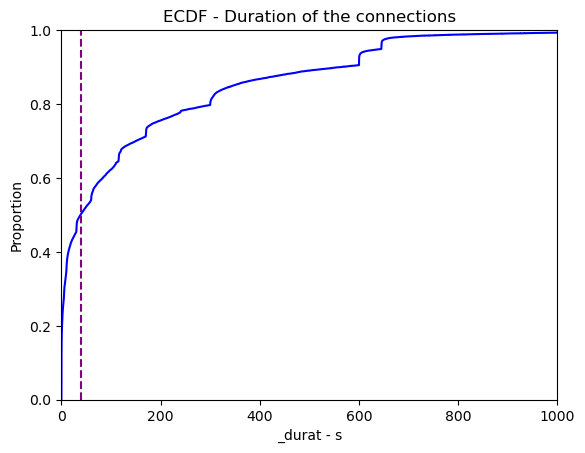

Median value of the duration of connections: 38.61 s


In [28]:
# ECDF _durat
df_flow_copy = df_flow.copy()
df_flow_copy["_durat"] = df_flow["_durat"]/(1000) #convert in s

# Calculate medians for the client and server features
median = df_flow_copy["_durat"].median()


plt.figure()
    
 # Plot the empirical cumulative distribution function (ECDF) for the server feature on the same figure
sns.ecdfplot(
  data = df_flow_copy,
  x = "_durat",
  color = "Blue",
)

# Mark median on the plot
plt.axvline(x=median, color="purple", linestyle="--", label="Median")

plt.title("ECDF - Duration of the connections")
plt.xlabel("_durat - s")
plt.xlim(0, 1000)

# Mostra il plot
plt.show()

# Display the median value
print(f"Median value of the duration of connections: {median:.2f} s")

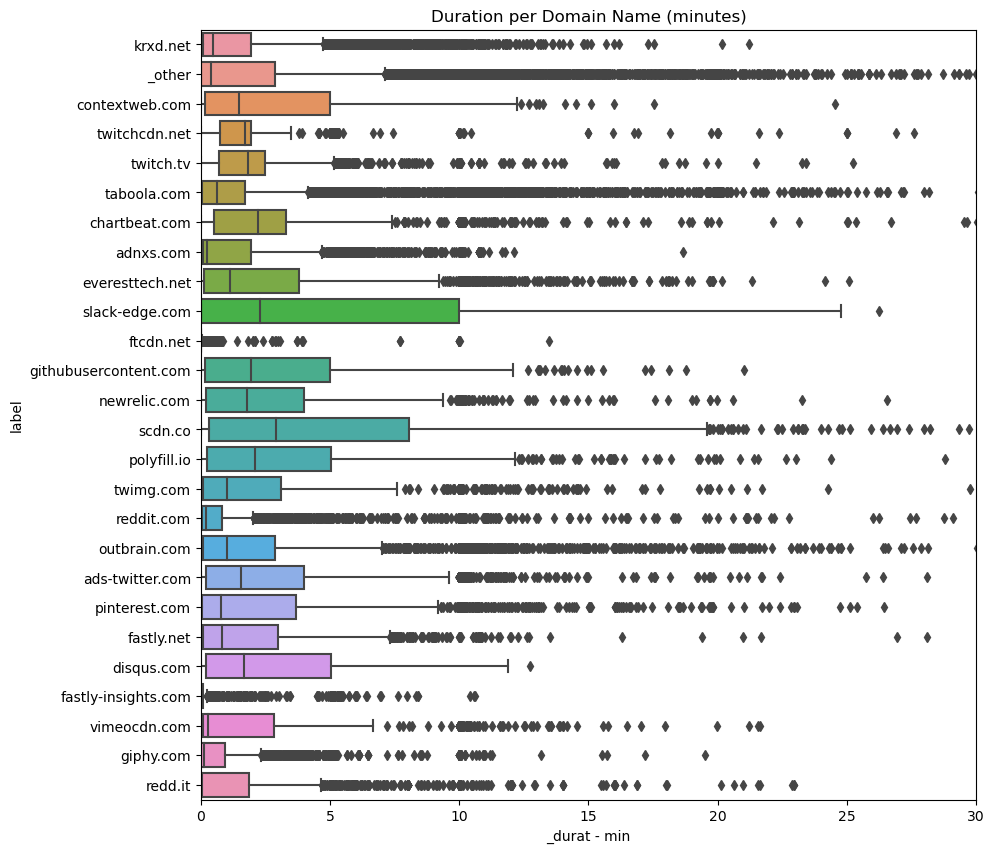

In [26]:
# _durat
df_copy = df_flow.copy()
df_copy["_durat"] = df_flow["_durat"]/(1000*60) #convert in min

plt.figure(figsize = (10, 10))
ax = sns.boxplot(
    data = df_copy,
    x = '_durat',
    y = 'label'
) 
plt.title("Duration per Domain Name (minutes)")
plt.xlabel("_durat - min")
plt.xlim(0,30)
plt.show()

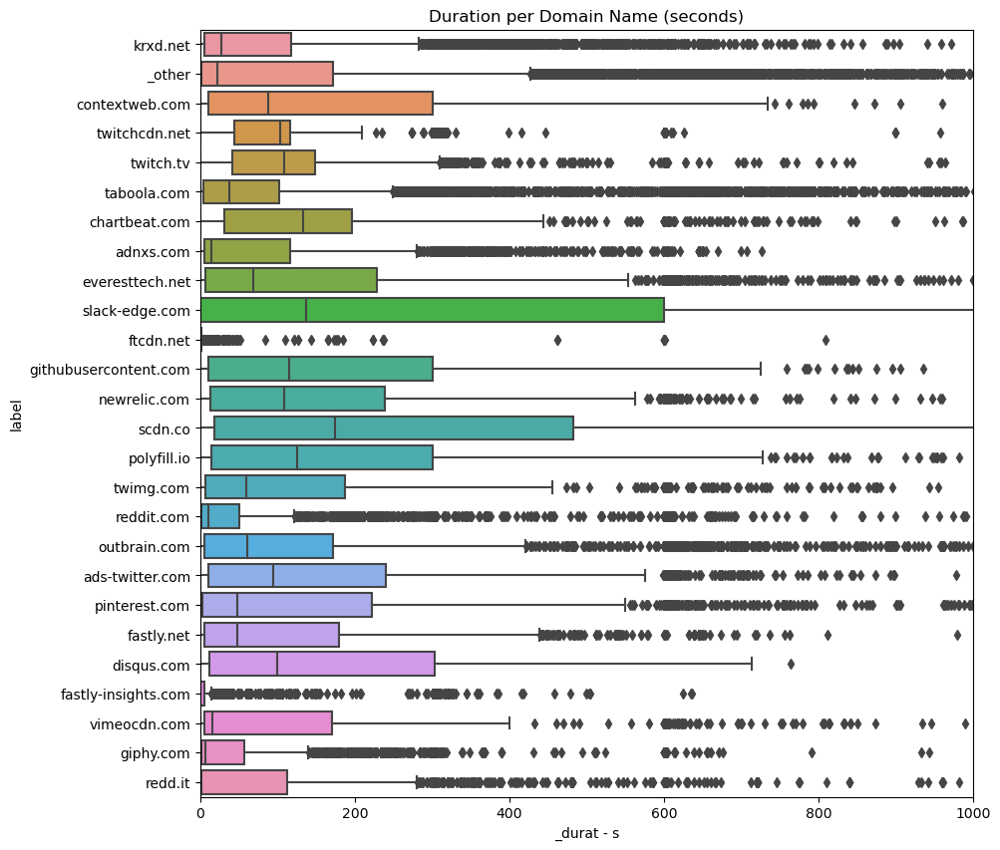

In [27]:
# _durat
df_copy = df_flow.copy()
df_copy["_durat"] = df_flow["_durat"]/(1000) #convert in s

plt.figure(figsize = (10, 10))
ax = sns.boxplot(
    data = df_copy,
    x = '_durat',
    y = 'label'
) 
plt.title("Duration per Domain Name (seconds)")
plt.xlabel("_durat - s")
plt.xlim(0,1000)
plt.show()

## Recap

At this point, we have three types of datasets for each of the following levels:

1. **Flow Level Dataset (`df_flow`):**
   - This dataset contains metrics at the flow level. Flows represent sequences of data packets between a source and destination in networking.

2. **Domain Name Level Dataset (`df_DomainName`):**
   - This dataset focuses on the domain name level, including information related to activities or metrics associated with different domain names.

3. **Client IP Level Dataset (`df_ip`):**
   - This dataset is specified at the client IP level, containing information or metrics related to individual client IP addresses. Each row in this dataset represents data associated with a specific client IP address.


In [ ]:
## Find Most Correlated Features at the three levels!!!!!!!

### Most Correlated Features at Flow Level

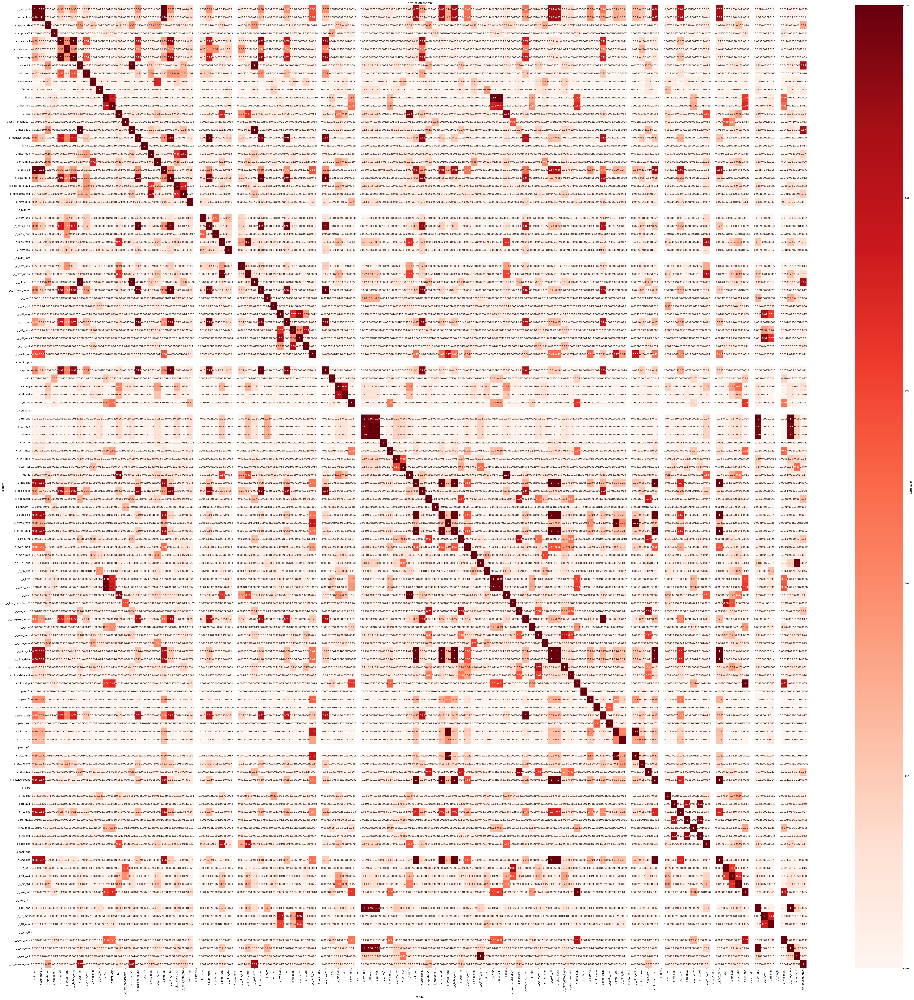

In [10]:
# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_flow.drop(columns = ["time", "c_ip", "label"]) # make a copy of the original dataset


scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = features_list[:-3])

#df_scaled.describe().round(0) #verify that the standardisation has been succesful


# Calculate the absolute correlation matrix for the scaled DataFrame
correlation_matrix = df_scaled.corr().abs()

# Set up the matplotlib figure size for the heatmap
plt.figure(figsize=(70, 70))

# Create a heatmap using seaborn with correlation values, color map, annotations, and color bar
sns.heatmap(correlation_matrix, 
            cmap='Reds',            # Color map for the heatmap
            annot=True,             # Display correlation values on the heatmap
            vmin=0,                 # Minimum value for the color map
            vmax=1,                 # Maximum value for the color map
            cbar_kws={'label': 'Correlation'})  # Color bar label

# Set x-axis label
plt.xlabel('Feature')

# Set y-axis label
plt.ylabel('Feature')

# Set the title of the plot
plt.title('Correlation matrix')

# Display the heatmap
plt.show()

In [53]:
def getMostCorrelatedFeatures(correlation_matrix):
    correlated_features = []
    for i, f1 in enumerate(correlation_matrix):
        for j, f2 in enumerate(correlation_matrix):
            if (i!=j and correlation_matrix.iloc[i, j]>0.8 and "%s and %s"%(f2, f1) not in correlated_features):
                correlated_features.append("%s and %s"%(f1, f2))
    return correlated_features

correlated_features = getMostCorrelatedFeatures(correlation_matrix)
print("Most Correlated Features at Flow Level:")
print("%d couple of features are highly correlated"%(len(correlated_features)))
for couple in correlated_features:
    print(couple)


            




Most Correlated Features at Flow Level:
135 couple of features are highly correlated
_c_ack_cnt and _c_ack_cnt_p
_c_ack_cnt and _c_pkts_all
_c_ack_cnt and _s_ack_cnt
_c_ack_cnt and _s_bytes_all
_c_ack_cnt and _s_bytes_uniq
_c_ack_cnt and _s_pkts_all
_c_ack_cnt and _s_pkts_data
_c_ack_cnt and _s_pktsize_count
_c_ack_cnt and _s_rtt_cnt
_c_ack_cnt and _s_seg_cnt
_c_ack_cnt_p and _c_pkts_all
_c_ack_cnt_p and _s_ack_cnt
_c_ack_cnt_p and _s_bytes_all
_c_ack_cnt_p and _s_bytes_uniq
_c_ack_cnt_p and _s_pkts_all
_c_ack_cnt_p and _s_pkts_data
_c_ack_cnt_p and _s_pktsize_count
_c_ack_cnt_p and _s_rtt_cnt
_c_ack_cnt_p and _s_seg_cnt
_c_bytes_all and _c_bytes_uniq
_c_bytes_all and _c_pkts_data
_c_bytes_all and _c_pktsize_count
_c_bytes_all and _c_seg_cnt
_c_bytes_all and _s_ack_cnt_p
_c_bytes_uniq and _c_pkts_data
_c_bytes_uniq and _c_pktsize_count
_c_bytes_uniq and _c_seg_cnt
_c_bytes_uniq and _s_ack_cnt_p
_c_cwin_ini and _c_msgsize1
_c_cwin_ini and _c_pktsize1
_c_cwin_ini and _tls_session_stat
_c

### Most Correlated Features at Client IP Level

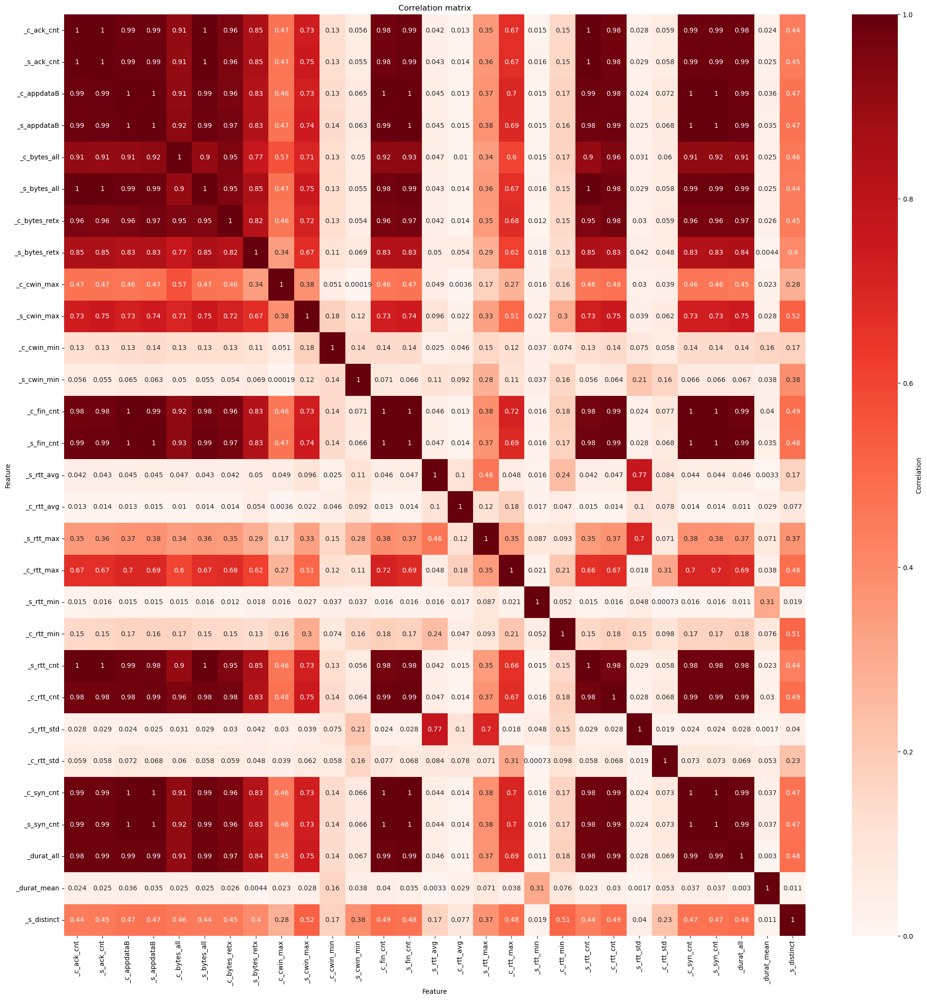

In [57]:
# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_ip.dropna() # make a copy of the original dataset


scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = df_toScale.columns)

#df_scaled.describe().round(0) #verify that the standardisation has been succesful


# Calculate the absolute correlation matrix for the scaled DataFrame
correlation_matrix = df_scaled.corr().abs()

# Set up the matplotlib figure size for the heatmap
plt.figure(figsize=(25, 25))

# Create a heatmap using seaborn with correlation values, color map, annotations, and color bar
sns.heatmap(correlation_matrix, 
            cmap='Reds',            # Color map for the heatmap
            annot=True,             # Display correlation values on the heatmap
            vmin=0,                 # Minimum value for the color map
            vmax=1,                 # Maximum value for the color map
            cbar_kws={'label': 'Correlation'})  # Color bar label

# Set x-axis label
plt.xlabel('Feature')

# Set y-axis label
plt.ylabel('Feature')

# Set the title of the plot
plt.title('Correlation matrix')

# Display the heatmap
plt.show()

In [58]:
def getMostCorrelatedFeatures(correlation_matrix):
    correlated_features = []
    for i, f1 in enumerate(correlation_matrix):
        for j, f2 in enumerate(correlation_matrix):
            if (i!=j and correlation_matrix.iloc[i, j]>0.8 and "%s and %s"%(f2, f1) not in correlated_features):
                correlated_features.append("%s and %s"%(f1, f2))
    return correlated_features

correlated_features = getMostCorrelatedFeatures(correlation_matrix)
print("Most Correlated Features at Flow Level:")
print("%d couple of features are highly correlated"%(len(correlated_features)))
for couple in correlated_features:
    print(couple)


            




Most Correlated Features at Flow Level:
104 couple of features are highly correlated
_c_ack_cnt and _s_ack_cnt
_c_ack_cnt and _c_appdataB
_c_ack_cnt and _s_appdataB
_c_ack_cnt and _c_bytes_all
_c_ack_cnt and _s_bytes_all
_c_ack_cnt and _c_bytes_retx
_c_ack_cnt and _s_bytes_retx
_c_ack_cnt and _c_fin_cnt
_c_ack_cnt and _s_fin_cnt
_c_ack_cnt and _s_rtt_cnt
_c_ack_cnt and _c_rtt_cnt
_c_ack_cnt and _c_syn_cnt
_c_ack_cnt and _s_syn_cnt
_c_ack_cnt and _durat_all
_s_ack_cnt and _c_appdataB
_s_ack_cnt and _s_appdataB
_s_ack_cnt and _c_bytes_all
_s_ack_cnt and _s_bytes_all
_s_ack_cnt and _c_bytes_retx
_s_ack_cnt and _s_bytes_retx
_s_ack_cnt and _c_fin_cnt
_s_ack_cnt and _s_fin_cnt
_s_ack_cnt and _s_rtt_cnt
_s_ack_cnt and _c_rtt_cnt
_s_ack_cnt and _c_syn_cnt
_s_ack_cnt and _s_syn_cnt
_s_ack_cnt and _durat_all
_c_appdataB and _s_appdataB
_c_appdataB and _c_bytes_all
_c_appdataB and _s_bytes_all
_c_appdataB and _c_bytes_retx
_c_appdataB and _s_bytes_retx
_c_appdataB and _c_fin_cnt
_c_appdataB and 

### Most Correlated Features at Domain Name Level

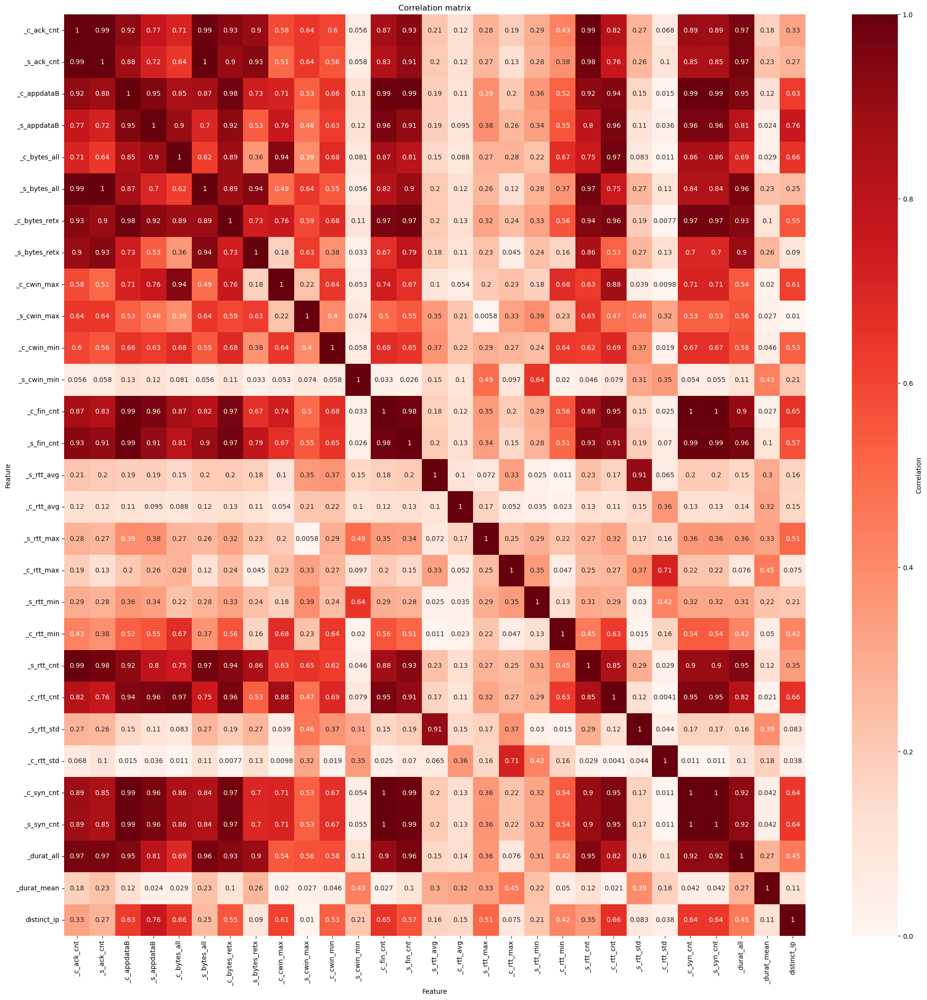

In [59]:
# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_DomainName.dropna() # make a copy of the original dataset


scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = df_toScale.columns)

#df_scaled.describe().round(0) #verify that the standardisation has been succesful


# Calculate the absolute correlation matrix for the scaled DataFrame
correlation_matrix = df_scaled.corr().abs()

# Set up the matplotlib figure size for the heatmap
plt.figure(figsize=(25, 25))

# Create a heatmap using seaborn with correlation values, color map, annotations, and color bar
sns.heatmap(correlation_matrix, 
            cmap='Reds',            # Color map for the heatmap
            annot=True,             # Display correlation values on the heatmap
            vmin=0,                 # Minimum value for the color map
            vmax=1,                 # Maximum value for the color map
            cbar_kws={'label': 'Correlation'})  # Color bar label

# Set x-axis label
plt.xlabel('Feature')

# Set y-axis label
plt.ylabel('Feature')

# Set the title of the plot
plt.title('Correlation matrix')

# Display the heatmap
plt.show()

In [60]:
def getMostCorrelatedFeatures(correlation_matrix):
    correlated_features = []
    for i, f1 in enumerate(correlation_matrix):
        for j, f2 in enumerate(correlation_matrix):
            if (i!=j and correlation_matrix.iloc[i, j]>0.8 and "%s and %s"%(f2, f1) not in correlated_features):
                correlated_features.append("%s and %s"%(f1, f2))
    return correlated_features

correlated_features = getMostCorrelatedFeatures(correlation_matrix)
print("Most Correlated Features at Flow Level:")
print("%d couple of features are highly correlated"%(len(correlated_features)))
for couple in correlated_features:
    print(couple)


            




Most Correlated Features at Flow Level:
88 couple of features are highly correlated
_c_ack_cnt and _s_ack_cnt
_c_ack_cnt and _c_appdataB
_c_ack_cnt and _s_bytes_all
_c_ack_cnt and _c_bytes_retx
_c_ack_cnt and _s_bytes_retx
_c_ack_cnt and _c_fin_cnt
_c_ack_cnt and _s_fin_cnt
_c_ack_cnt and _s_rtt_cnt
_c_ack_cnt and _c_rtt_cnt
_c_ack_cnt and _c_syn_cnt
_c_ack_cnt and _s_syn_cnt
_c_ack_cnt and _durat_all
_s_ack_cnt and _c_appdataB
_s_ack_cnt and _s_bytes_all
_s_ack_cnt and _c_bytes_retx
_s_ack_cnt and _s_bytes_retx
_s_ack_cnt and _c_fin_cnt
_s_ack_cnt and _s_fin_cnt
_s_ack_cnt and _s_rtt_cnt
_s_ack_cnt and _c_syn_cnt
_s_ack_cnt and _s_syn_cnt
_s_ack_cnt and _durat_all
_c_appdataB and _s_appdataB
_c_appdataB and _c_bytes_all
_c_appdataB and _s_bytes_all
_c_appdataB and _c_bytes_retx
_c_appdataB and _c_fin_cnt
_c_appdataB and _s_fin_cnt
_c_appdataB and _s_rtt_cnt
_c_appdataB and _c_rtt_cnt
_c_appdataB and _c_syn_cnt
_c_appdataB and _s_syn_cnt
_c_appdataB and _durat_all
_s_appdataB and _c_by

### Dimensionality Reduction - Principal Component Analysis 
In this section we will apply **PCA** to the features at the 3 levels in order to:
- visualize data more easily
- avoid curse of dimensionality
- discard irrelevant features, capturing the important ones

### PCA - flow level

In [16]:
# working dataset 
df_flow
df_columns = list(df_flow.columns)
len(df_columns)

123

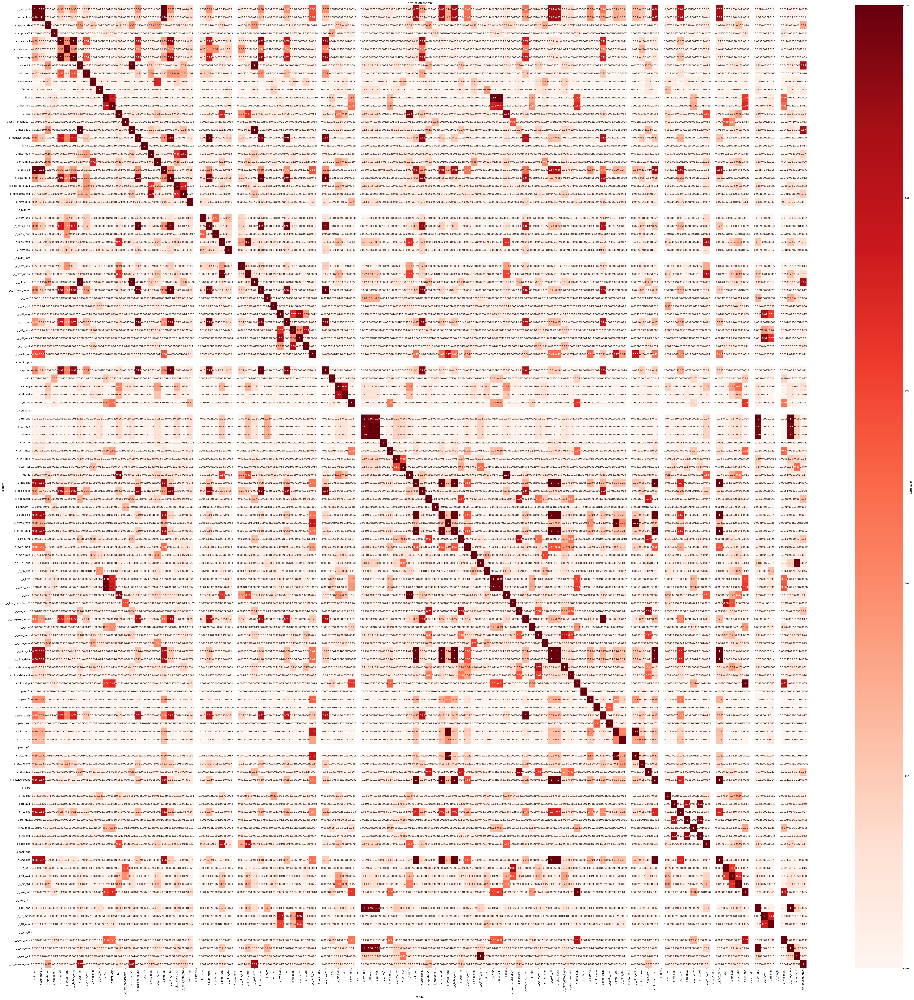

In [17]:
# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_flow.drop(columns = ["time", "c_ip", "label"]) # make a copy of the original dataset


scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = features_list[:-3])

#df_scaled.describe().round(0) #verify that the standardisation has been succesful


# Calculate the absolute correlation matrix for the scaled DataFrame
correlation_matrix = df_scaled.corr().abs()

# Set up the matplotlib figure size for the heatmap
plt.figure(figsize=(70, 70))

# Create a heatmap using seaborn with correlation values, color map, annotations, and color bar
sns.heatmap(correlation_matrix, 
            cmap='Reds',            # Color map for the heatmap
            annot=True,             # Display correlation values on the heatmap
            vmin=0,                 # Minimum value for the color map
            vmax=1,                 # Maximum value for the color map
            cbar_kws={'label': 'Correlation'})  # Color bar label

# Set x-axis label
plt.xlabel('Feature')

# Set y-axis label
plt.ylabel('Feature')

# Set the title of the plot
plt.title('Correlation matrix')

# Display the heatmap
plt.show()



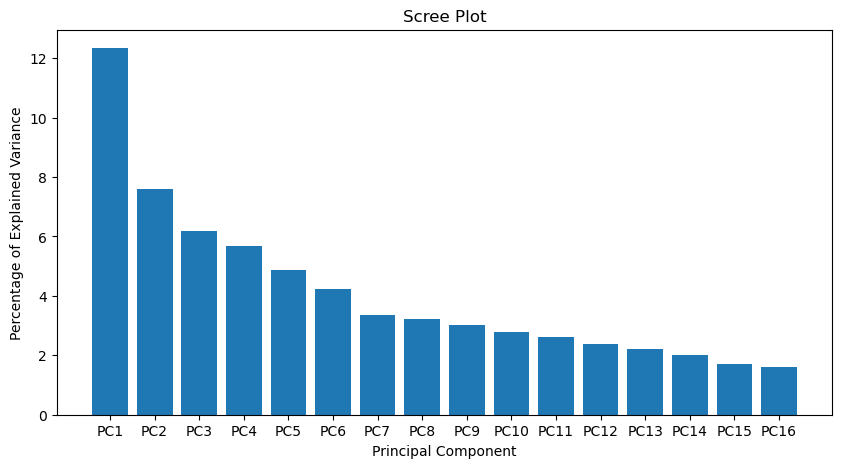

In [18]:
# PCA must be initialized with a random state to initialize the space
pca = PCA(random_state=15)

# .fit() is used to compute the new dimensions with the number of features 
# from 1 to the number of original features
pca.fit(df_scaled)

# describe how much of the dataset variability is indicated by a given amount of features
explained_variance = pca.explained_variance_ratio_
perc_explained_variance = explained_variance*100
perc_explained_variance = perc_explained_variance.round(2)

# evaluate the total dataset variability while increasing the variables
cumul_exp_var = np.cumsum(explained_variance)

# percentage value to better understand the best number of components
perc_cumul_exp_var = cumul_exp_var * 100
perc_cumul_exp_var = perc_cumul_exp_var.round(2)


PCs_columns = [f"PC{i}" for i in range(1, df_toScale.shape[1]+1)]

plt.figure(figsize = (10, 5))
plt.bar(
    #x = range(1, df_toScale.shape[1]+1),
    x = range(1, 17),
    height = perc_explained_variance[:16],
    tick_label = PCs_columns[:16]
)
plt.ylabel("Percentage of Explained Variance")
plt.xlabel("Principal Component")
plt.title("Scree Plot")
plt.show()


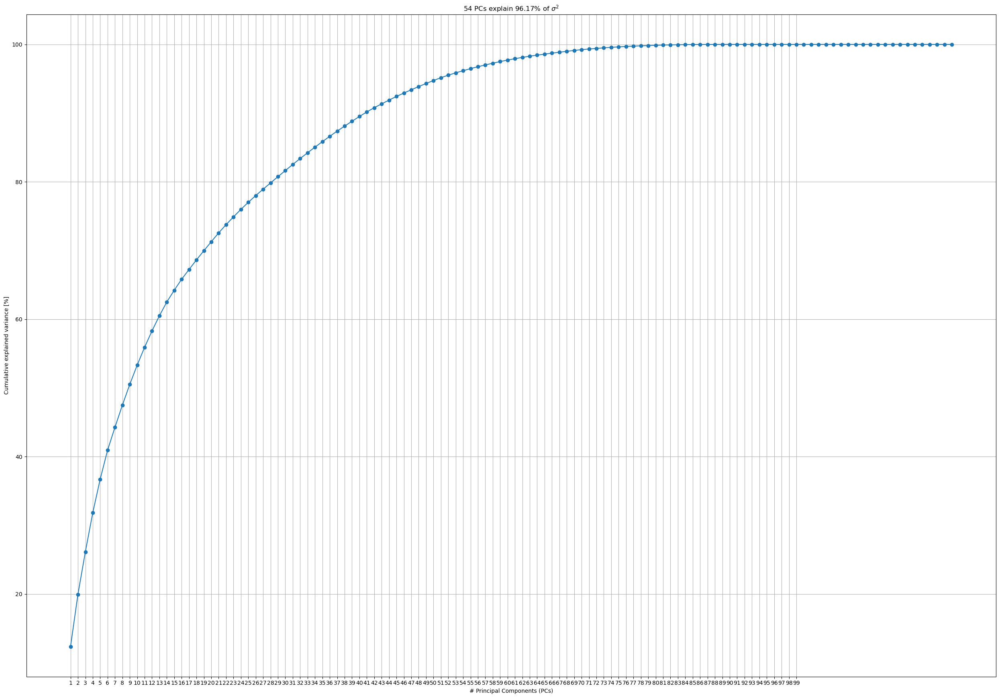

In [19]:
totPC = 54 #constant to change the number of PC chosen

# make the plot of cumulative explained variance wrt the number of components
plt.figure(figsize=(25, 17.5))  # Set the size of the plot
plt.plot(perc_cumul_exp_var, marker='o')  # Plot the cumulative explained variance
plt.xlabel('# Principal Components (PCs)')  # Set x-axis label
plt.ylabel('Cumulative explained variance [%]')  # Set y-axis label
plt.xticks([i for i in range(99)], [i for i in range(1,100)])  # Set custom x-axis ticks and labels
plt.grid()  # Display grid lines on the plot
plt.title(f'{totPC} PCs explain {round(perc_cumul_exp_var[totPC-1], 2)}% of $\sigma^2$')  # Set the plot title
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()  # Display the plot




In [20]:
# initialize the PCA with the best number of components, in this case, it's 3
pca = PCA(n_components=totPC, random_state=15)

# fit the data to new space
pca.fit(df_scaled)

# transform the original data into PCA components
pca_result = pca.transform(df_scaled)





# create the new dataset
df_pca = pd.DataFrame(pca_result, columns=PCs_columns[:totPC])

df_pca['time'] = df['time']
df_pca['c_ip'] = df['c_ip']
df_pca['label'] = df['label']
df_pca





,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC48,PC49,PC50,PC51,PC52,PC53,PC54,time,c_ip,label
0,-0.538622,-0.151930,1.170176,0.351047,-3.484045,1.123573,0.639315,0.601949,-0.120560,-0.731853,...,-0.202472,0.082884,0.142199,0.001672,-0.157758,0.559736,-0.132922,1.561932e+09,67.32.225.92,krxd.net
1,-0.622701,-1.009110,4.175367,-1.234769,0.416497,1.384049,0.805744,1.761023,-0.142161,3.616029,...,-0.041673,-0.097563,-0.266861,-0.023506,-0.046478,0.684409,-0.127998,1.561932e+09,67.32.181.213,_other
2,-0.543756,0.143082,1.681588,-0.134517,-3.464410,1.735240,0.585501,-2.156979,-0.082740,-0.154143,...,0.170136,0.085802,0.346554,0.061931,-0.059122,0.354913,-0.402657,1.561932e+09,67.32.225.92,contextweb.com
3,-0.695278,0.150124,-0.612389,0.158030,-2.677851,-2.808174,-0.679537,1.314895,0.303578,1.408060,...,-0.082195,-0.022824,0.853631,0.060903,0.058795,0.281478,-0.106361,1.561932e+09,67.32.124.163,twitchcdn.net
4,-0.733648,0.163170,-0.692769,0.484799,-3.229827,-3.195908,0.593782,2.679578,-0.026634,1.291644,...,-0.166499,-0.129649,0.067997,-0.111140,-0.195393,0.571984,-0.053683,1.561932e+09,67.32.124.163,twitchcdn.net
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147858,-0.642604,0.413789,-1.619283,0.333084,-1.924713,-2.193410,-0.891552,2.447998,0.315377,-0.629388,...,0.073320,-0.023889,0.212926,0.066623,-0.083533,0.001363,-0.018360,1.562018e+09,67.32.124.163,twitchcdn.net
147859,-0.574847,0.362891,-0.967625,0.279273,-1.516398,-2.271466,0.138560,1.903815,0.073939,-0.388443,...,0.158145,-0.010079,0.583251,0.077454,0.094466,0.034663,-0.089438,1.562018e+09,67.32.124.163,twitch.tv
147860,-0.563014,-0.216229,0.705614,-0.711656,3.829149,-2.395845,0.770230,1.404665,-0.126205,0.028799,...,0.046190,0.006981,0.269714,0.020332,0.063891,0.005967,-0.023099,1.562019e+09,67.32.230.26,everesttech.net
147861,-0.528341,-0.113884,0.717119,-0.720322,3.542234,-2.310082,0.814716,0.995002,-0.128992,0.141129,...,0.059440,0.034161,0.236259,0.015105,0.031255,-0.021372,-0.057865,1.562019e+09,67.32.230.26,everesttech.net


#### Plotting loading scores
In the context of **Principal Component Analysis (PCA)**, **loading scores** represent the coefficients of the original variables (features) in the linear combination that forms each **principal component**. 
These coefficients indicate the contribution of each original variable to the principal component.

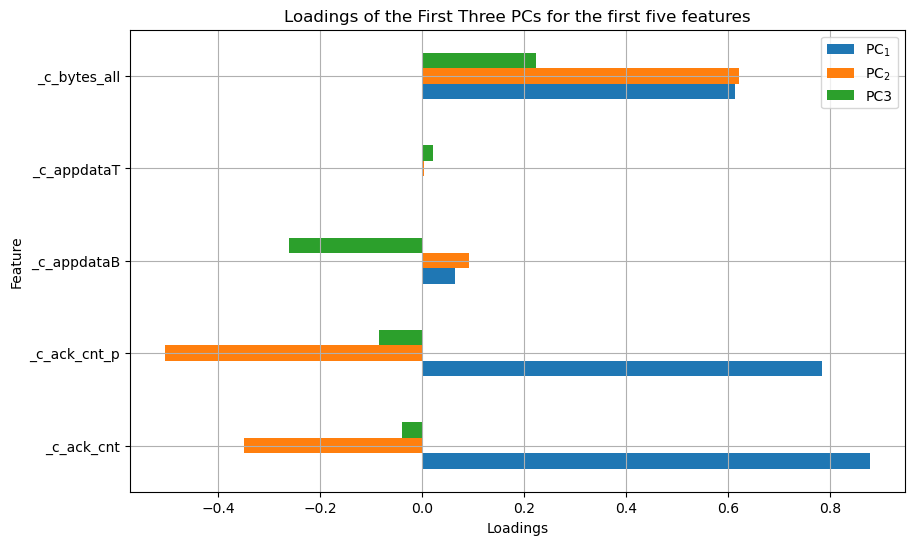

In [23]:
# Compute the loading scores and create the dataframe

# pca.components_: Principal components (loading vectors) of the data
# pca.explained_variance_: Explained variance for each principal component
# np.sqrt(pca.explained_variance_): Square root of explained variance (scaling factor)
# Multiply principal components by the scaling factor to get the loading scores
loading_scores_data = pca.components_.T * np.sqrt(pca.explained_variance_)

# Create a DataFrame with loading scores
loadings = pd.DataFrame(
    data=loading_scores_data,
    columns=PCs_columns[:totPC],
    index=df_columns[:120]
)

#print(loadings.round(2)) #visualize loadings

# Select the first three features and the corresponding loadings for the first three PCs
selected_loadings = loadings[['PC1', 'PC2', 'PC3']].loc[df_columns[:5]]

# Plot a horizontal bar chart
plt.figure(figsize=(10, 6))  # Set the figure size
selected_loadings.rename(columns={'PC1':'PC$_{1}$', 'PC2':'PC$_{2}$', 'PC2':'PC$_{2}$'}).plot.barh(ax=plt.gca(), legend = True) # Transpose for better visualization
plt.grid(True)  # Display grid lines
plt.xlabel('Loadings')  # Set x-axis label
plt.ylabel('Feature')  # Set y-axis label
plt.title(f'Loadings of the First Three PCs for the first five features')  # Set the plot title
plt.show()




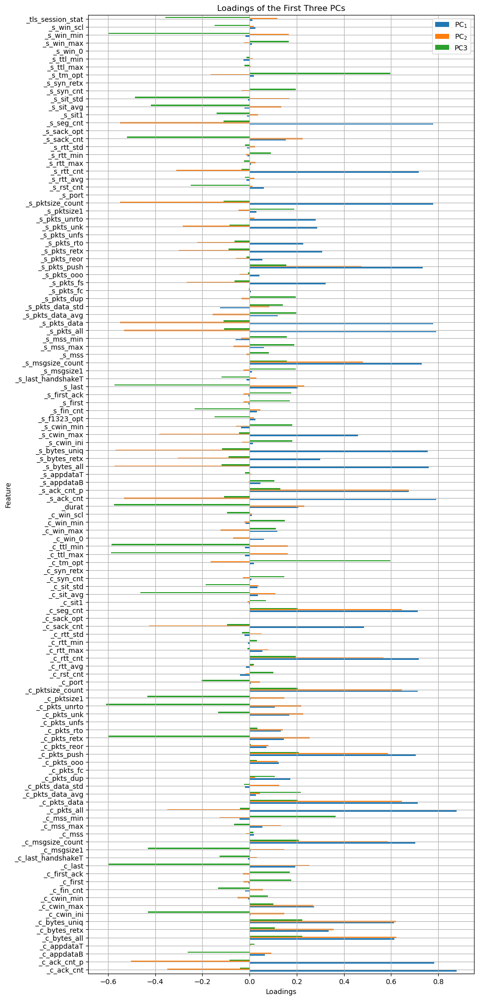

In [25]:
# Select the first three features and the corresponding loadings for the first three PCs
selected_loadings = loadings[['PC1', 'PC2', 'PC3']].loc[df_columns[:-3]]

# Plot a horizontal bar chart
plt.figure(figsize=(10, 25))  # Set the figure size
selected_loadings.rename(columns={'PC1':'PC$_{1}$', 'PC2':'PC$_{2}$', 'PC2':'PC$_{2}$'}).plot.barh(ax=plt.gca(), legend = True) # Transpose for better visualization
plt.grid(True)  # Display grid lines
plt.xlabel('Loadings')  # Set x-axis label
plt.ylabel('Feature')  # Set y-axis label
plt.title(f'Loadings of the First Three PCs')  # Set the plot title
plt.show()

### PCA - Client IP Level

In [27]:
# working dataset 
df_ip
df_columns = list(df_ip.columns)
len(df_columns)

29

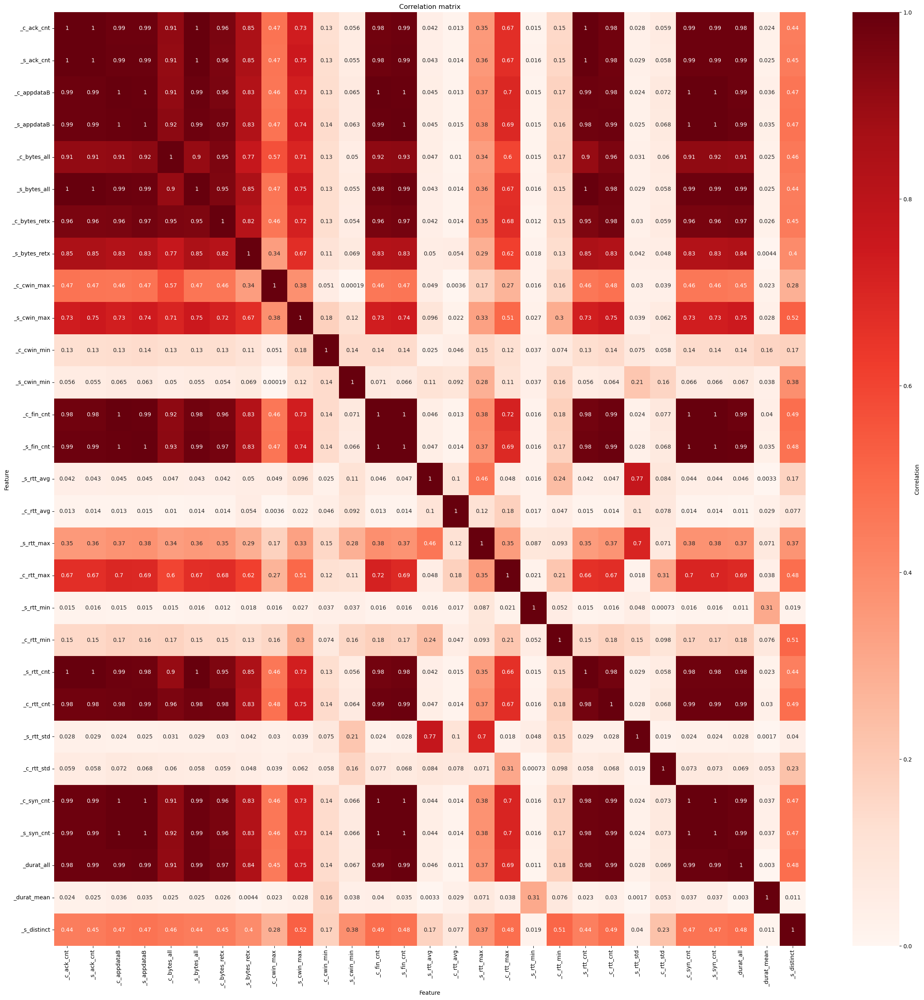

In [34]:
# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_ip.dropna() # make a copy of the original dataset

scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = df_ip.columns)

#df_scaled.describe().round(0) #verify that the standardisation has been succesful


# Calculate the absolute correlation matrix for the scaled DataFrame
correlation_matrix = df_scaled.corr().abs()

# Set up the matplotlib figure size for the heatmap
plt.figure(figsize=(30, 30))

# Create a heatmap using seaborn with correlation values, color map, annotations, and color bar
sns.heatmap(correlation_matrix, 
            cmap='Reds',            # Color map for the heatmap
            annot=True,             # Display correlation values on the heatmap
            vmin=0,                 # Minimum value for the color map
            vmax=1,                 # Maximum value for the color map
            cbar_kws={'label': 'Correlation'})  # Color bar label

# Set x-axis label
plt.xlabel('Feature')

# Set y-axis label
plt.ylabel('Feature')

# Set the title of the plot
plt.title('Correlation matrix')

# Display the heatmap
plt.show()



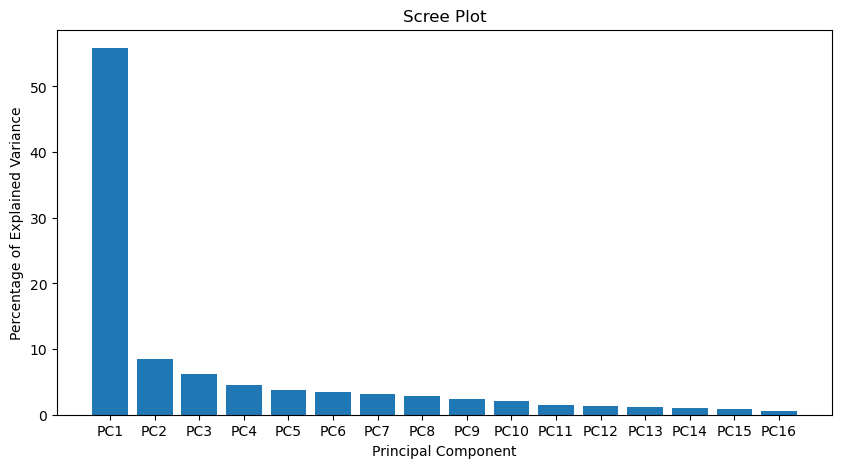

In [35]:
# PCA must be initialized with a random state to initialize the space
pca = PCA(random_state=15)

# .fit() is used to compute the new dimensions with the number of features 
# from 1 to the number of original features
pca.fit(df_scaled)

# describe how much of the dataset variability is indicated by a given amount of features
explained_variance = pca.explained_variance_ratio_
perc_explained_variance = explained_variance*100
perc_explained_variance = perc_explained_variance.round(2)

# evaluate the total dataset variability while increasing the variables
cumul_exp_var = np.cumsum(explained_variance)

# percentage value to better understand the best number of components
perc_cumul_exp_var = cumul_exp_var * 100
perc_cumul_exp_var = perc_cumul_exp_var.round(2)


PCs_columns = [f"PC{i}" for i in range(1, df_toScale.shape[1]+1)]

plt.figure(figsize = (10, 5))
plt.bar(
    #x = range(1, df_toScale.shape[1]+1),
    x = range(1, 17),
    height = perc_explained_variance[:16],
    tick_label = PCs_columns[:16]
)
plt.ylabel("Percentage of Explained Variance")
plt.xlabel("Principal Component")
plt.title("Scree Plot")
plt.show()


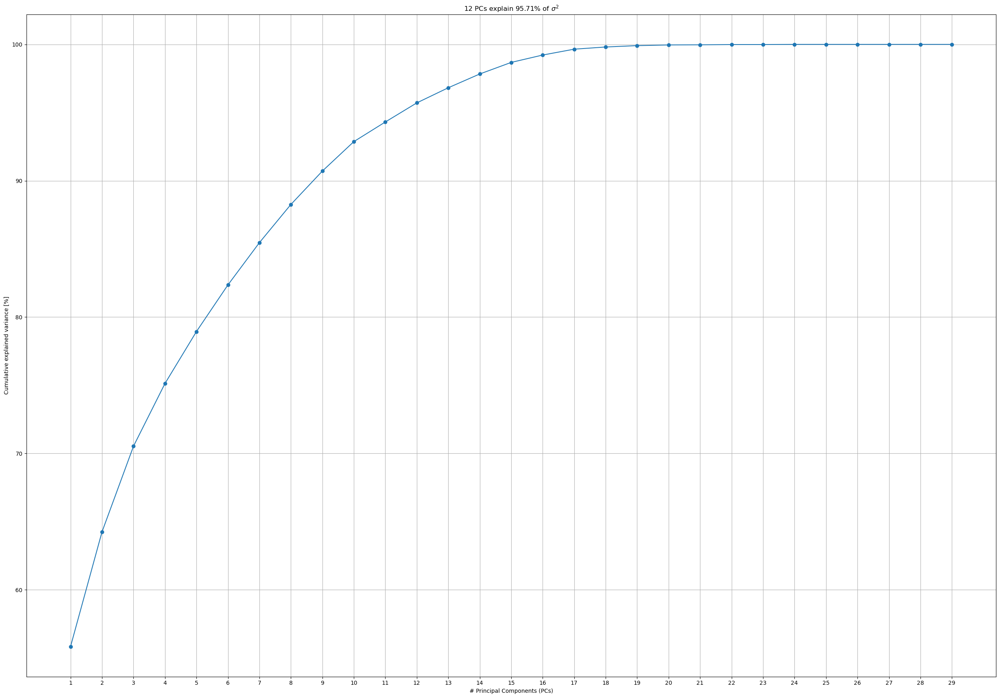

In [39]:
totPC = 12 #constant to change the number of PC chosen

# make the plot of cumulative explained variance wrt the number of components
plt.figure(figsize=(25, 17.5))  # Set the size of the plot
plt.plot(perc_cumul_exp_var, marker='o')  # Plot the cumulative explained variance
plt.xlabel('# Principal Components (PCs)')  # Set x-axis label
plt.ylabel('Cumulative explained variance [%]')  # Set y-axis label
plt.xticks([i for i in range(29)], [i for i in range(1,30)])  # Set custom x-axis ticks and labels
plt.grid()  # Display grid lines on the plot
plt.title(f'{totPC} PCs explain {round(perc_cumul_exp_var[totPC-1], 2)}% of $\sigma^2$')  # Set the plot title
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()  # Display the plot




In [41]:
# initialize the PCA with the best number of components, in this case, it's 3
pca = PCA(n_components=totPC, random_state=15)

# fit the data to new space
pca.fit(df_scaled)

# transform the original data into PCA components
pca_result = pca.transform(df_scaled)





# create the new dataset
df_pca = pd.DataFrame(pca_result, columns=PCs_columns[:totPC])
df_pca





,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12
0,-0.497484,-0.567010,0.643984,-0.407992,-0.682023,0.606903,-0.120824,-0.283884,-0.027220,0.686821,-0.492364,-0.017494
1,-0.910097,1.542858,-1.686066,1.479127,0.357909,0.177877,0.766750,-0.777583,0.768025,-0.979324,-0.479810,0.306740
2,-0.843476,-0.821331,-0.470162,-0.713154,0.869988,0.109465,-0.268417,-0.279622,0.847291,0.479536,-0.437942,-0.238052
3,-0.780391,-1.139397,-0.458707,0.478375,-0.059185,0.466199,-0.623049,-0.454572,0.629494,-0.462632,-0.551097,-0.014336
4,-0.258010,-1.208357,0.511046,-0.290209,-0.942879,0.462991,0.122472,-0.502545,-0.062402,0.255862,-0.260536,-1.433207
...,...,...,...,...,...,...,...,...,...,...,...,...
674,-0.640490,-0.997216,0.109138,-0.529722,-0.298825,0.376426,-0.099478,-0.379487,0.379537,0.577061,-0.787250,-0.180017
675,-0.550492,-1.126057,0.982202,0.938321,0.210698,0.759019,0.008709,-0.331210,0.169993,-0.707926,-0.458779,0.136979
676,-0.997492,-1.442299,-2.007525,-0.365714,0.446973,0.114392,-0.601823,0.336724,-0.326558,0.139146,0.277108,0.129610
677,0.086191,-0.366800,2.192037,0.291044,-0.839335,-0.348835,0.311984,-0.036083,-0.359083,-0.931731,0.520887,0.475323


#### Plotting loading scores
In the context of **Principal Component Analysis (PCA)**, **loading scores** represent the coefficients of the original variables (features) in the linear combination that forms each **principal component**. 
These coefficients indicate the contribution of each original variable to the principal component.

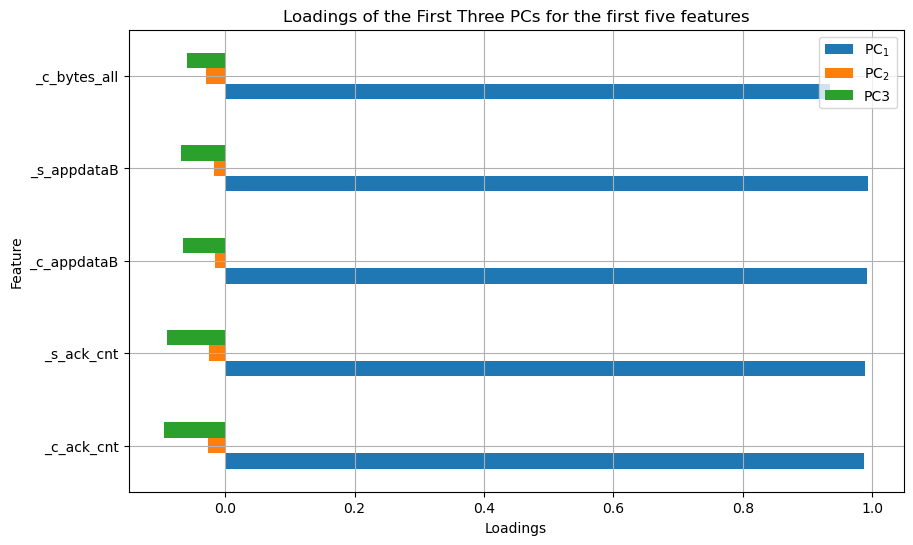

In [42]:
# Compute the loading scores and create the dataframe

# pca.components_: Principal components (loading vectors) of the data
# pca.explained_variance_: Explained variance for each principal component
# np.sqrt(pca.explained_variance_): Square root of explained variance (scaling factor)
# Multiply principal components by the scaling factor to get the loading scores
loading_scores_data = pca.components_.T * np.sqrt(pca.explained_variance_)

# Create a DataFrame with loading scores
loadings = pd.DataFrame(
    data=loading_scores_data,
    columns=PCs_columns[:totPC],
    index=df_columns[:120]
)

#print(loadings.round(2)) #visualize loadings

# Select the first three features and the corresponding loadings for the first three PCs
selected_loadings = loadings[['PC1', 'PC2', 'PC3']].loc[df_columns[:5]]

# Plot a horizontal bar chart
plt.figure(figsize=(10, 6))  # Set the figure size
selected_loadings.rename(columns={'PC1':'PC$_{1}$', 'PC2':'PC$_{2}$', 'PC2':'PC$_{2}$'}).plot.barh(ax=plt.gca(), legend = True) # Transpose for better visualization
plt.grid(True)  # Display grid lines
plt.xlabel('Loadings')  # Set x-axis label
plt.ylabel('Feature')  # Set y-axis label
plt.title(f'Loadings of the First Three PCs for the first five features')  # Set the plot title
plt.show()




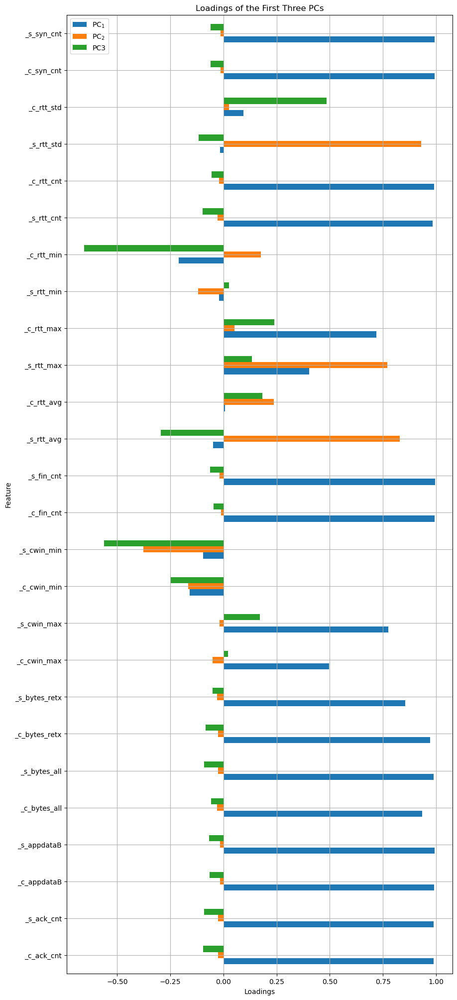

In [43]:
# Select the first three features and the corresponding loadings for the first three PCs
selected_loadings = loadings[['PC1', 'PC2', 'PC3']].loc[df_columns[:-3]]

# Plot a horizontal bar chart
plt.figure(figsize=(10, 25))  # Set the figure size
selected_loadings.rename(columns={'PC1':'PC$_{1}$', 'PC2':'PC$_{2}$', 'PC2':'PC$_{2}$'}).plot.barh(ax=plt.gca(), legend = True) # Transpose for better visualization
plt.grid(True)  # Display grid lines
plt.xlabel('Loadings')  # Set x-axis label
plt.ylabel('Feature')  # Set y-axis label
plt.title(f'Loadings of the First Three PCs')  # Set the plot title
plt.show()

### PCA - Domain Name Level

In [44]:
# working dataset 
df_DomainName
df_columns = list(df_DomainName.columns)
len(df_columns)

29

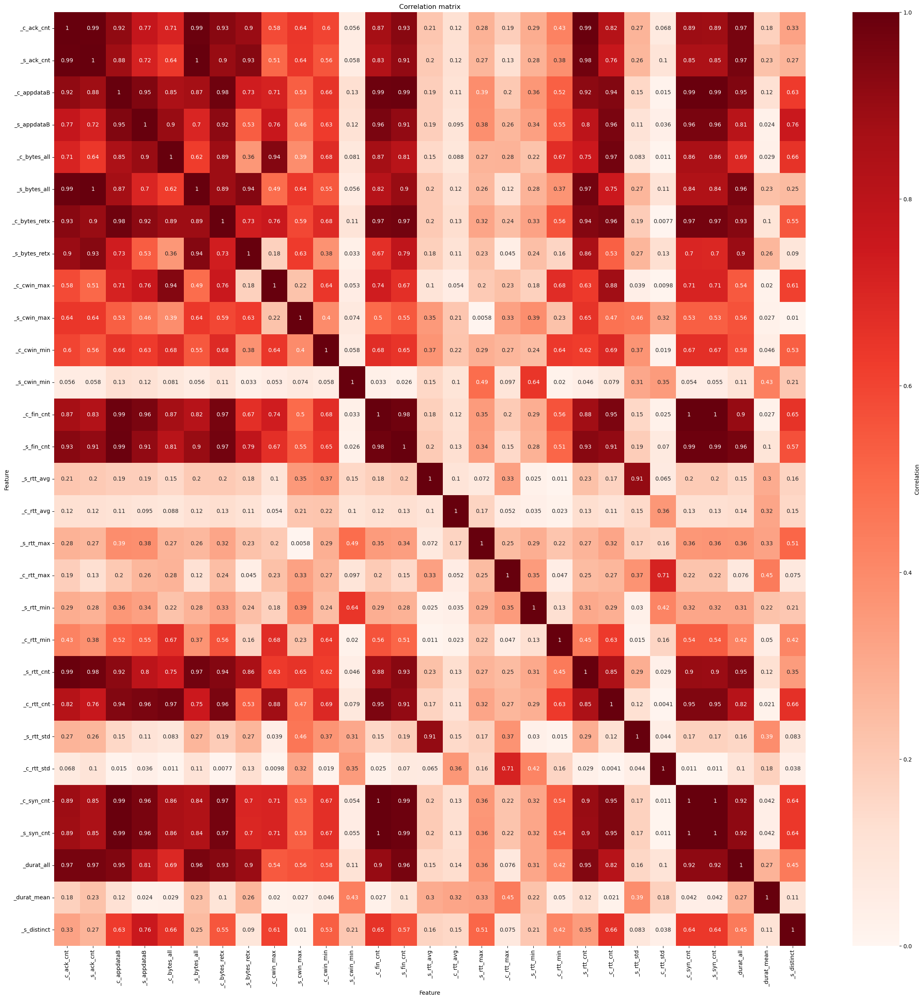

In [45]:
# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_DomainName.dropna() # make a copy of the original dataset

scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = df_ip.columns)

#df_scaled.describe().round(0) #verify that the standardisation has been succesful


# Calculate the absolute correlation matrix for the scaled DataFrame
correlation_matrix = df_scaled.corr().abs()

# Set up the matplotlib figure size for the heatmap
plt.figure(figsize=(30, 30))

# Create a heatmap using seaborn with correlation values, color map, annotations, and color bar
sns.heatmap(correlation_matrix, 
            cmap='Reds',            # Color map for the heatmap
            annot=True,             # Display correlation values on the heatmap
            vmin=0,                 # Minimum value for the color map
            vmax=1,                 # Maximum value for the color map
            cbar_kws={'label': 'Correlation'})  # Color bar label

# Set x-axis label
plt.xlabel('Feature')

# Set y-axis label
plt.ylabel('Feature')

# Set the title of the plot
plt.title('Correlation matrix')

# Display the heatmap
plt.show()



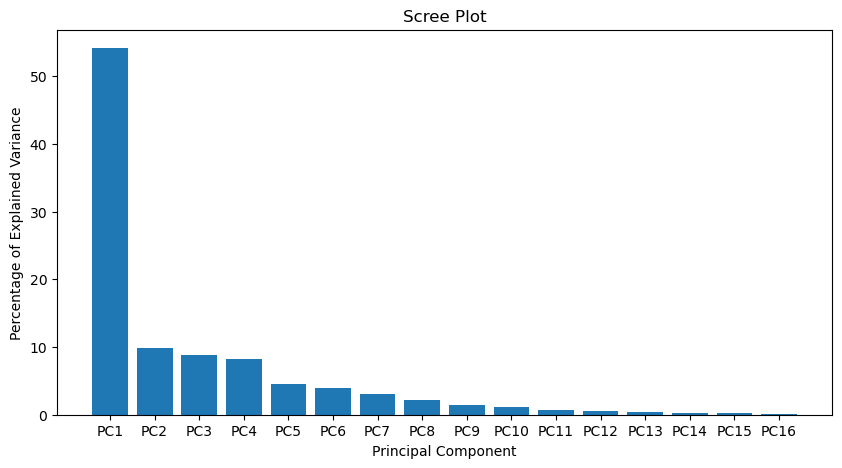

In [46]:
# PCA must be initialized with a random state to initialize the space
pca = PCA(random_state=15)

# .fit() is used to compute the new dimensions with the number of features 
# from 1 to the number of original features
pca.fit(df_scaled)

# describe how much of the dataset variability is indicated by a given amount of features
explained_variance = pca.explained_variance_ratio_
perc_explained_variance = explained_variance*100
perc_explained_variance = perc_explained_variance.round(2)

# evaluate the total dataset variability while increasing the variables
cumul_exp_var = np.cumsum(explained_variance)

# percentage value to better understand the best number of components
perc_cumul_exp_var = cumul_exp_var * 100
perc_cumul_exp_var = perc_cumul_exp_var.round(2)


PCs_columns = [f"PC{i}" for i in range(1, df_toScale.shape[1]+1)]

plt.figure(figsize = (10, 5))
plt.bar(
    #x = range(1, df_toScale.shape[1]+1),
    x = range(1, 17),
    height = perc_explained_variance[:16],
    tick_label = PCs_columns[:16]
)
plt.ylabel("Percentage of Explained Variance")
plt.xlabel("Principal Component")
plt.title("Scree Plot")
plt.show()


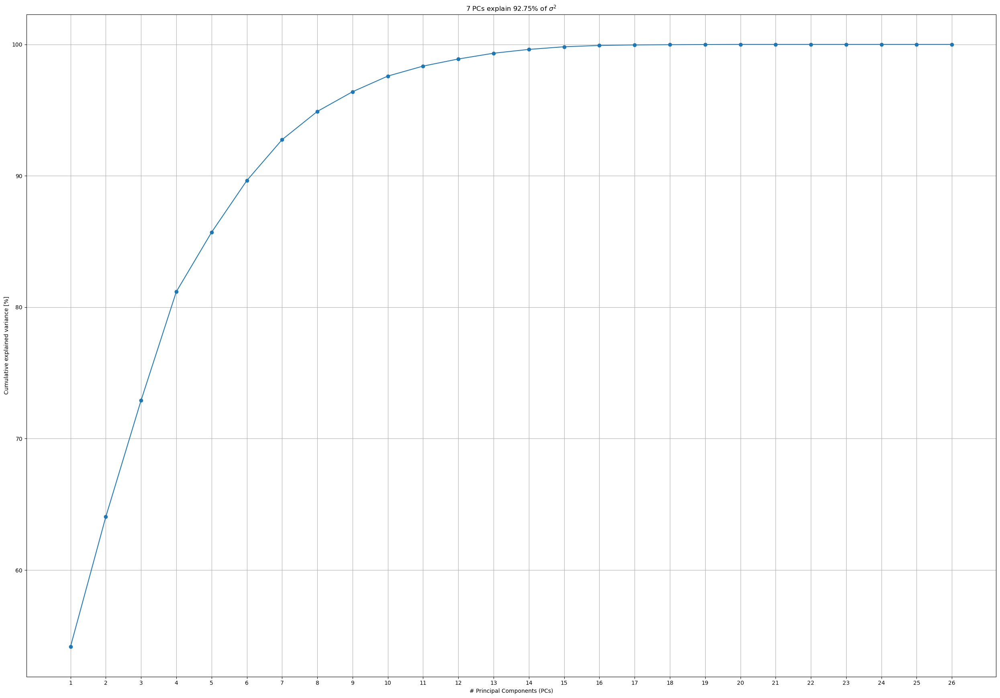

In [51]:
totPC = 7 #constant to change the number of PC chosen

# make the plot of cumulative explained variance wrt the number of components
plt.figure(figsize=(25, 17.5))  # Set the size of the plot
plt.plot(perc_cumul_exp_var, marker='o')  # Plot the cumulative explained variance
plt.xlabel('# Principal Components (PCs)')  # Set x-axis label
plt.ylabel('Cumulative explained variance [%]')  # Set y-axis label
plt.xticks([i for i in range(26)], [i for i in range(1,27)])  # Set custom x-axis ticks and labels
plt.grid()  # Display grid lines on the plot
plt.title(f'{totPC} PCs explain {round(perc_cumul_exp_var[totPC-1], 2)}% of $\sigma^2$')  # Set the plot title
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()  # Display the plot




In [52]:
# initialize the PCA with the best number of components, in this case, it's 3
pca = PCA(n_components=totPC, random_state=15)

# fit the data to new space
pca.fit(df_scaled)

# transform the original data into PCA components
pca_result = pca.transform(df_scaled)





# create the new dataset
df_pca = pd.DataFrame(pca_result, columns=PCs_columns[:totPC])
df_pca





,PC1,PC2,PC3,PC4,PC5,PC6,PC7
0,14.571333,-1.393336,-1.968393,3.246307,-0.162130,0.792861,0.851276
1,-1.070568,0.152053,-0.786042,0.900050,-0.302490,-1.031417,-0.630696
2,-2.238231,-1.172155,0.850723,0.184895,-0.179636,-1.008719,-0.936788
3,-2.128753,-3.067141,1.183429,-0.134422,-0.148713,0.302374,-0.171127
4,-1.051073,-0.394459,-0.306565,0.522156,0.474836,-1.030598,0.779304
5,-1.324063,0.239463,-0.561014,-0.191594,0.175154,-0.237818,-0.127128
6,-1.213321,-1.337947,0.246696,0.567073,0.369844,-1.420451,-0.817155
7,-2.421659,1.845916,0.910156,1.768700,4.756702,1.989814,-0.371286
8,-2.616656,0.576128,0.193054,-1.205153,-0.386896,0.749566,-1.951825
9,-2.034843,4.369579,2.601117,4.429641,-2.348748,-0.181928,-0.604709


#### Plotting loading scores
In the context of **Principal Component Analysis (PCA)**, **loading scores** represent the coefficients of the original variables (features) in the linear combination that forms each **principal component**. 
These coefficients indicate the contribution of each original variable to the principal component.

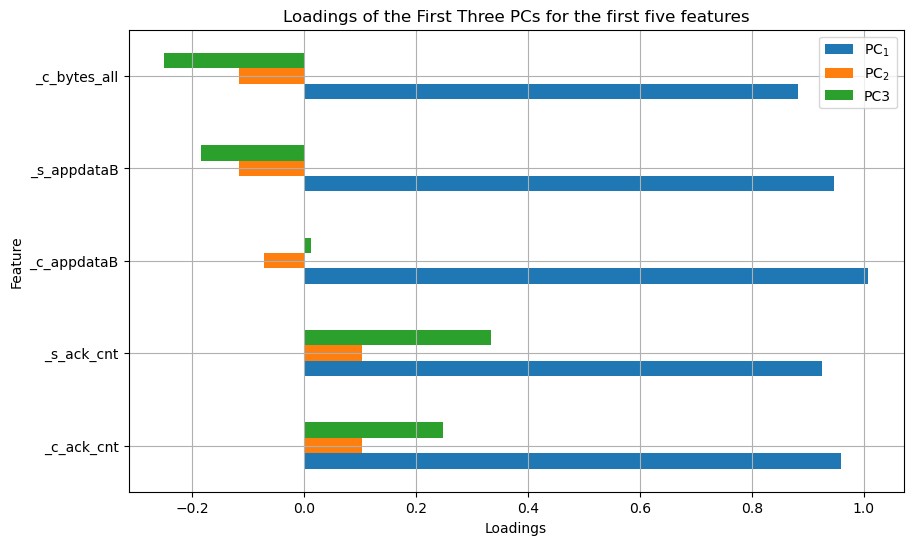

In [53]:
# Compute the loading scores and create the dataframe

# pca.components_: Principal components (loading vectors) of the data
# pca.explained_variance_: Explained variance for each principal component
# np.sqrt(pca.explained_variance_): Square root of explained variance (scaling factor)
# Multiply principal components by the scaling factor to get the loading scores
loading_scores_data = pca.components_.T * np.sqrt(pca.explained_variance_)

# Create a DataFrame with loading scores
loadings = pd.DataFrame(
    data=loading_scores_data,
    columns=PCs_columns[:totPC],
    index=df_columns[:120]
)

#print(loadings.round(2)) #visualize loadings

# Select the first three features and the corresponding loadings for the first three PCs
selected_loadings = loadings[['PC1', 'PC2', 'PC3']].loc[df_columns[:5]]

# Plot a horizontal bar chart
plt.figure(figsize=(10, 6))  # Set the figure size
selected_loadings.rename(columns={'PC1':'PC$_{1}$', 'PC2':'PC$_{2}$', 'PC2':'PC$_{2}$'}).plot.barh(ax=plt.gca(), legend = True) # Transpose for better visualization
plt.grid(True)  # Display grid lines
plt.xlabel('Loadings')  # Set x-axis label
plt.ylabel('Feature')  # Set y-axis label
plt.title(f'Loadings of the First Three PCs for the first five features')  # Set the plot title
plt.show()




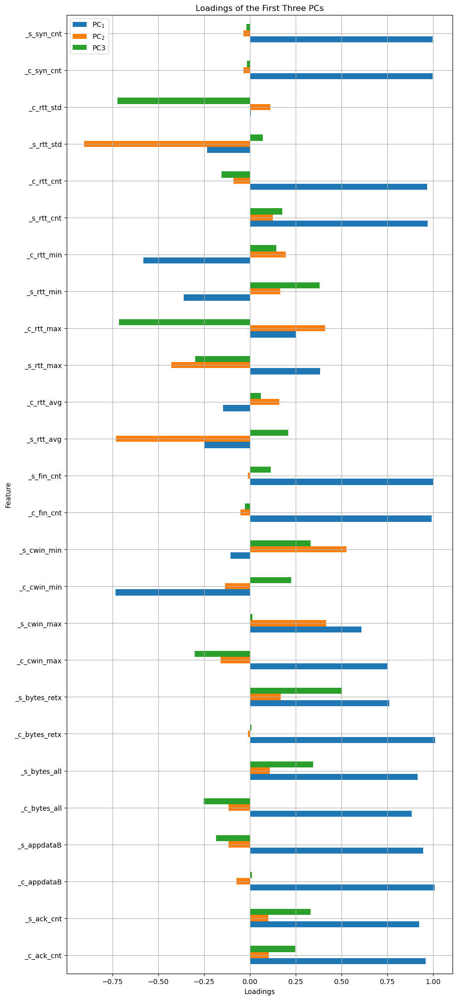

In [54]:
# Select the first three features and the corresponding loadings for the first three PCs
selected_loadings = loadings[['PC1', 'PC2', 'PC3']].loc[df_columns[:-3]]

# Plot a horizontal bar chart
plt.figure(figsize=(10, 25))  # Set the figure size
selected_loadings.rename(columns={'PC1':'PC$_{1}$', 'PC2':'PC$_{2}$', 'PC2':'PC$_{2}$'}).plot.barh(ax=plt.gca(), legend = True) # Transpose for better visualization
plt.grid(True)  # Display grid lines
plt.xlabel('Loadings')  # Set x-axis label
plt.ylabel('Feature')  # Set y-axis label
plt.title(f'Loadings of the First Three PCs')  # Set the plot title
plt.show()

### Dimensionality Reduction - tSNE 
In this section we will apply **tSNE** to the features at the 3 levels in order to:
- visualize data more easily
- avoid curse of dimensionality
- discard irrelevant features, capturing the important ones

#### tSNE at flow level

In [48]:
%%time

# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_flow.iloc[:, :-3] # make a copy of the original dataset

scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = features_list[:-3])

features_array = np.array(df_scaled.values) #15.27

tSNE_result = TSNE(
    n_components=2,        # Number of dimensions in the embedded space (usually 2 or 3)
    learning_rate='auto',  # Learning rate for the optimization (use 'auto' for adaptive learning rates)
    init='random',         # Initialization of embedding ('random' or specify an ndarray)
    perplexity=10          # Perplexity parameter, influences the balance between global and local aspects of the data
).fit_transform(features_array)


tSNE_result

CPU times: user 1h 18min 9s, sys: 30min 47s, total: 1h 48min 56s
Wall time: 19min 58s


array([[-42.853664,  43.03277 ],
       [101.912895,  18.470814],
       [-37.221695,  38.549725],
       ...,
       [-45.82788 ,  17.202677],
       [ -7.741609,  15.274576],
       [ 16.243477, -27.45316 ]], dtype=float32)

In [50]:
# create the new dataset
tSNE_columns = [f"dim-{i}" for i in range(1, 3)]
df_tSNE = pd.DataFrame(tSNE_result, columns=tSNE_columns)

df_tSNE['time'] = df_flow['time']
df_tSNE['c_ip'] = df_flow['c_ip']
df_tSNE['label'] = df_flow['label']
df_tSNE

,dim-1,dim-2,time,c_ip,label
0,-42.853664,43.032768,1.561932e+09,67.32.225.92,krxd.net
1,101.912895,18.470814,1.561932e+09,67.32.181.213,_other
2,-37.221695,38.549725,1.561932e+09,67.32.225.92,contextweb.com
3,-1.200871,-60.992470,1.561932e+09,67.32.124.163,twitchcdn.net
4,-24.307844,105.671379,1.561932e+09,67.32.124.163,twitchcdn.net
...,...,...,...,...,...
147858,-83.728592,-74.814964,1.562018e+09,67.32.124.163,twitchcdn.net
147859,-2.679251,124.280510,1.562018e+09,67.32.124.163,twitch.tv
147860,-45.827881,17.202677,1.562019e+09,67.32.230.26,everesttech.net
147861,-7.741609,15.274576,1.562019e+09,67.32.230.26,everesttech.net


In [57]:
# Store the obtained dataset in a csv file in order to recover it in future
csv_file_path = "tSNE_df_flow.csv"

# to csv file
df_tSNE.to_csv(csv_file_path, index=False)

Il dataset tSNE è stato salvato su: tSNE_df_flow.csv


In [6]:
# recover the tSNE_df_flow dataset
df_tSNE = pd.read_csv("tSNE_df_flow.csv")
df_tSNE

,dim-1,dim-2,time,c_ip,label
0,-42.853664,43.032770,1.561932e+09,67.32.225.92,krxd.net
1,101.912895,18.470814,1.561932e+09,67.32.181.213,_other
2,-37.221695,38.549725,1.561932e+09,67.32.225.92,contextweb.com
3,-1.200872,-60.992470,1.561932e+09,67.32.124.163,twitchcdn.net
4,-24.307844,105.671380,1.561932e+09,67.32.124.163,twitchcdn.net
...,...,...,...,...,...
147858,-83.728590,-74.814964,1.562018e+09,67.32.124.163,twitchcdn.net
147859,-2.679251,124.280510,1.562018e+09,67.32.124.163,twitch.tv
147860,-45.827880,17.202677,1.562019e+09,67.32.230.26,everesttech.net
147861,-7.741609,15.274576,1.562019e+09,67.32.230.26,everesttech.net


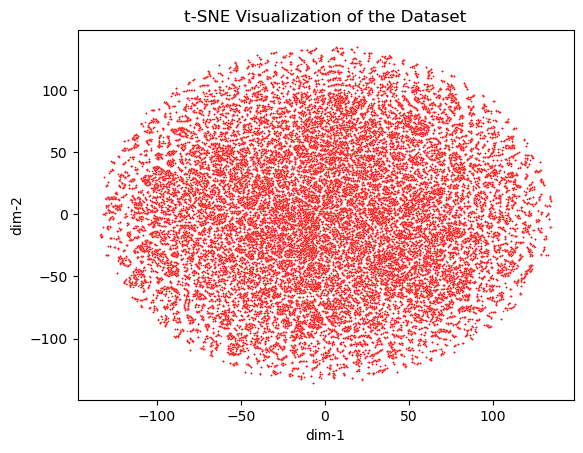

In [24]:
# Scatter plot of the t-SNE results

# Set the figure size for the scatter plot
plt.figure()

# Create a scatter plot using seaborn
sns.scatterplot(
    x='dim-1',           # x-axis corresponds to t-SNE dimension 1
    y='dim-2',           # y-axis corresponds to t-SNE dimension 2
    color='red',    # Set the color to dark gray for all points
    data=df_tSNE,         # Use data from the df_tSNE DataFrame
    alpha=0.7,            # Set the transparency of points for better visualization
    s=1               # Set the size of the markers
)

# Set the title of the plot
plt.title('t-SNE Visualization of the Dataset')

# Display the plot
plt.show()

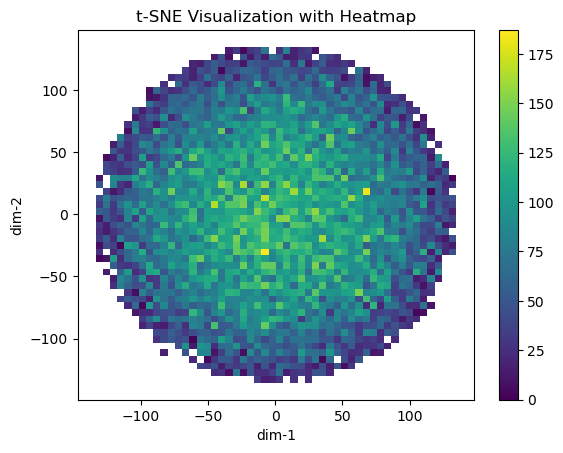

In [30]:
# Set the figure size for the scatter plot and heatmap
plt.figure()


# Create a heatmap using seaborn to count occurrences in each bin
sns.histplot(
    x='dim-1',           # x-axis corresponds to t-SNE dimension 1
    y='dim-2',           # y-axis corresponds to t-SNE dimension 2
    data=df_tSNE,         # Use data from the df_tSNE DataFrame
    bins=50,             # Set the number of bins in each dimension
    cmap='viridis',      # Choose a colormap
    cbar=True             # Display colorbar
)

# Set the title of the plot
plt.title('t-SNE Visualization with Heatmap')

# Display the plot
plt.show()


#### tSNE at Client IP level

In [31]:
%%time

# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_ip.dropna() # make a copy of the original dataset

scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = df_ip.columns)

features_array = np.array(df_scaled.values) #13.30

tSNE_result = TSNE(
    n_components=2,        # Number of dimensions in the embedded space (usually 2 or 3)
    learning_rate='auto',  # Learning rate for the optimization (use 'auto' for adaptive learning rates)
    init='random',         # Initialization of embedding ('random' or specify an ndarray)
    perplexity=35          # Perplexity parameter, influences the balance between global and local aspects of the data
).fit_transform(features_array)


tSNE_result


CPU times: user 11.6 s, sys: 1.4 s, total: 13 s
Wall time: 1.63 s


array([[ 13.409399 ,   3.3676293],
       [-15.896369 , -10.820548 ],
       [-11.249726 ,   6.0125566],
       ...,
       [-18.190088 ,  22.144918 ],
       [ 20.16643  , -10.963343 ],
       [ 12.708379 ,  -8.086668 ]], dtype=float32)

In [32]:
# create the new dataset
tSNE_columns = [f"dim-{i}" for i in range(1, 3)]
df_tSNE = pd.DataFrame(tSNE_result, columns=tSNE_columns)

df_tSNE['c_ip'] = df_ip.dropna().index
df_tSNE

,dim-1,dim-2,c_ip
0,13.409399,3.367629,67.32.100.15
1,-15.896369,-10.820548,67.32.100.172
2,-11.249726,6.012557,67.32.100.217
3,21.797750,14.312222,67.32.100.226
4,19.683180,8.364916,67.32.100.228
...,...,...,...
674,11.071060,7.256649,67.32.97.86
675,25.260366,8.799650,67.32.99.1
676,-18.190088,22.144918,67.32.99.11
677,20.166430,-10.963343,67.32.99.149


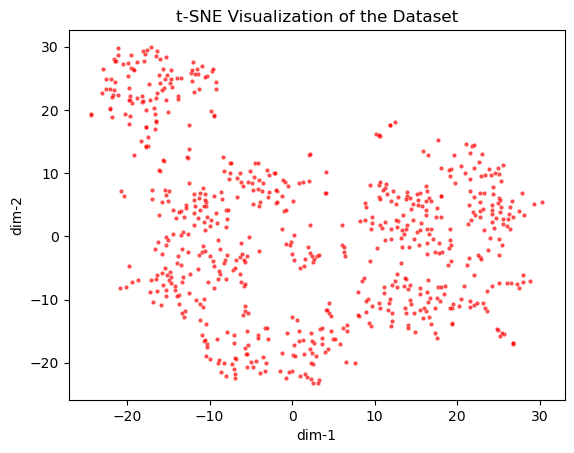

In [35]:
# Scatter plot of the t-SNE results

# Set the figure size for the scatter plot
plt.figure()

# Create a scatter plot using seaborn
sns.scatterplot(
    x='dim-1',           # x-axis corresponds to t-SNE dimension 1
    y='dim-2',           # y-axis corresponds to t-SNE dimension 2
    color='red',    # Set the color to dark gray for all points
    data=df_tSNE,         # Use data from the df_tSNE DataFrame
    alpha=0.7,            # Set the transparency of points for better visualization
    s=10               # Set the size of the markers
)

# Set the title of the plot
plt.title('t-SNE Visualization of the Dataset')

# Display the plot
plt.show()

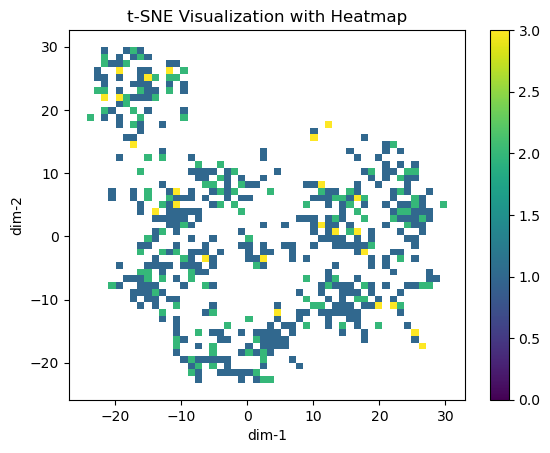

In [36]:
# Set the figure size for the scatter plot and heatmap
plt.figure()


# Create a heatmap using seaborn to count occurrences in each bin
sns.histplot(
    x='dim-1',           # x-axis corresponds to t-SNE dimension 1
    y='dim-2',           # y-axis corresponds to t-SNE dimension 2
    data=df_tSNE,         # Use data from the df_tSNE DataFrame
    bins=50,             # Set the number of bins in each dimension
    cmap='viridis',      # Choose a colormap
    cbar=True             # Display colorbar
)

# Set the title of the plot
plt.title('t-SNE Visualization with Heatmap')

# Display the plot
plt.show()


#### tSNE at Domain Name level

In [37]:
%%time

# we need to scale the original dataset in order to have mean = 0 and std = 1
df_toScale = df_DomainName.dropna() # make a copy of the original dataset

scaler = StandardScaler()

#fit_transform
df_scaled = scaler.fit_transform(df_toScale)
df_scaled = pd.DataFrame(df_scaled, columns = df_DomainName.columns)

features_array = np.array(df_scaled.values) #13.30

tSNE_result = TSNE(
    n_components=2,        # Number of dimensions in the embedded space (usually 2 or 3)
    learning_rate='auto',  # Learning rate for the optimization (use 'auto' for adaptive learning rates)
    init='random',         # Initialization of embedding ('random' or specify an ndarray)
    perplexity=35          # Perplexity parameter, influences the balance between global and local aspects of the data
).fit_transform(features_array)


tSNE_result


CPU times: user 815 ms, sys: 74.2 ms, total: 889 ms
Wall time: 125 ms


array([[ 80.64205  , -32.948128 ],
       [ 48.807785 , -70.27733  ],
       [ 53.178127 ,  -1.2896129],
       [ 91.52708  ,   9.818101 ],
       [-56.60793  ,  17.287413 ],
       [ 74.803604 ,  67.62157  ],
       [-24.056913 , -60.21872  ],
       [-63.20686  , -61.052704 ],
       [  2.8466785,  52.176044 ],
       [  5.503131 , -86.06649  ],
       [ 61.470768 ,  32.802246 ],
       [ -9.817942 , -24.062687 ],
       [-45.134087 , -27.459345 ],
       [ 36.570457 ,  62.598988 ],
       [ 12.97618  ,  91.77707  ],
       [-80.41836  , -16.447086 ],
       [-61.581787 ,  60.711266 ],
       [ 42.826225 , -33.574482 ],
       [-90.66197  ,  27.232498 ],
       [ 18.58749  ,  -8.48788  ],
       [-26.088923 ,  79.87301  ],
       [ 28.032255 ,  25.622831 ],
       [-28.992489 ,   1.95493  ],
       [-29.170162 ,  40.307613 ],
       [ -2.470721 ,  17.231    ],
       [ 12.353494 , -48.576767 ]], dtype=float32)

In [57]:
# create the new dataset
tSNE_columns = [f"dim-{i}" for i in range(1, 3)]
df_tSNE = pd.DataFrame(tSNE_result, columns=tSNE_columns)

df_tSNE['label'] = df_DomainName.dropna().index
df_tSNE

,dim-1,dim-2,label
0,80.642052,-32.948128,_other
1,48.807785,-70.277328,adnxs.com
2,53.178127,-1.289613,ads-twitter.com
3,91.527077,9.818101,chartbeat.com
4,-56.607929,17.287413,contextweb.com
5,74.803604,67.621567,disqus.com
6,-24.056913,-60.218719,everesttech.net
7,-63.206860,-61.052704,fastly-insights.com
8,2.846678,52.176044,fastly.net
9,5.503131,-86.066490,ftcdn.net


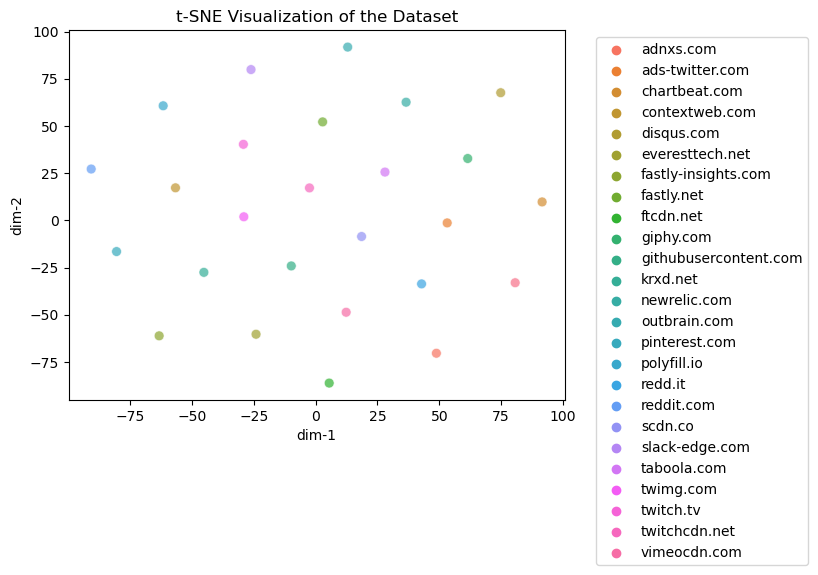

In [72]:
# Scatter plot of the t-SNE results

# Set the figure size for the scatter plot
plt.figure()

# Create a scatter plot using seaborn
sns.scatterplot(
    x='dim-1',           # x-axis corresponds to t-SNE dimension 1
    y='dim-2',           # y-axis corresponds to t-SNE dimension 2
    hue = "label",    # Set the color to dark gray for all points
    data=df_tSNE,         # Use data from the df_tSNE DataFrame
    alpha=0.7,            # Set the transparency of points for better visualization
    s=50               # Set the size of the markers
)

# Set the title of the plot
plt.title('t-SNE Visualization of the Dataset')

# Move the legend outside the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.show()